In [8]:
%load_ext autoreload
%load_ext tensorboard
%matplotlib inline

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [9]:
import matplotlib
import numpy as np
import os
import random
import yaml
import matplotlib.pyplot as plt
import numpy as np
from matplotlib import rc
from matplotlib import cm
import seaborn as sns
from importlib import reload
from pathlib import Path
import sklearn
import joblib
import torch
import pandas as pd
import copy

# Utils

In [10]:

from collections import defaultdict
def reject_outliers(data, m = 4.):
    return data
    d = np.abs(data - np.median(data))
    mdev = np.median(d)
    s = d/mdev if mdev else np.zeros(d.shape)
    return data[s<m]

def process_results(results, model_names):
    processed_results = defaultdict(lambda: defaultdict(list))
    for split, split_results in results.items():
        for key, vals in split_results.items():
            model_found = None
            var_found = None
            vals_found = None
            for model_cand_name in model_names:
                if ("_"  + model_cand_name) in key:
                    var_found, model_found = key.split(model_cand_name)
                    model_found = model_cand_name + model_found
                    var_found = var_found[:-1]  # Get rid of the end "_"
                    vals_found = vals
                    break
            if model_found is None:
                continue

            processed_results[var_found][model_found].append(vals_found)
    for var_found, models in processed_results.items():
        for model_found, vals in models.items():
            processed_results[var_found][model_found] = reject_outliers(np.array(vals))
    return processed_results

def get_intervention_accuracies(
    results,
    model_name,
    policy_name=None,
    competence_level=1,
):
    key = f'test_acc_y_{policy_name}_ints'
    if (competence_level is not None) and (competence_level != 1):
        key = f'test_acc_y_{policy_name}_ints_competence_{competence_level}'
    metric_results = results[key]
    if model_name not in metric_results:
        raise ValueError(
            f'We could not find {model_name} amongst models {list(metric_results.keys())}'
        )
    y_acc_vals = metric_results[model_name]
    y_acc_vals = np.array(y_acc_vals) * 100
    means = np.mean(y_acc_vals, axis=0)
    stds = np.std(y_acc_vals, axis=0)
    return means, stds

# Global Variables

In [11]:
################################################################################
## Global Variables Defining Experiment Flow
################################################################################

GPU = 1
NUM_WORKERS = 8
rc('text', usetex=False)
plt.style.use('seaborn-whitegrid')
plt.rcParams["font.family"] = "serif"

# Load CUB Dataset

In [12]:
import cem.data.CUB200.cub_loader as cub_data_module
RESULTS_DIR = "/anfs/bigdisc/me466/intervention_experiment_results/intervention_policies/cem/results/" #"./results/"
result_dir = os.path.join(RESULTS_DIR, "cub_interventions/")
with open(os.path.join(result_dir, "experiment_2023_05_13_23_50_config.yaml"), "r") as f:
    experiment_config = yaml.load(f, Loader=yaml.FullLoader)
experiment_config['shared_params']['batch_size'] = 512
experiment_config['shared_params']['num_workers'] = 4
train_dl, val_dl, test_dl, imbalance, (n_concepts, n_tasks, concept_map) = \
    cub_data_module.generate_data(
        config=experiment_config['shared_params'],
        seed=42,
        output_dataset_vars=True,
        root_dir='/homes/me466/data/CUB200/',
    )

Global seed set to 42


In [15]:
CLASS_NAMES = [
    "Black_footed_Albatross",
    "Laysan_Albatross",
    "Sooty_Albatross",
    "Groove_billed_Ani",
    "Crested_Auklet",
    "Least_Auklet",
    "Parakeet_Auklet",
    "Rhinoceros_Auklet",
    "Brewer_Blackbird",
    "Red_winged_Blackbird",
    "Rusty_Blackbird",
    "Yellow_headed_Blackbird",
    "Bobolink",
    "Indigo_Bunting",
    "Lazuli_Bunting",
    "Painted_Bunting",
    "Cardinal",
    "Spotted_Catbird",
    "Gray_Catbird",
    "Yellow_breasted_Chat",
    "Eastern_Towhee",
    "Chuck_will_Widow",
    "Brandt_Cormorant",
    "Red_faced_Cormorant",
    "Pelagic_Cormorant",
    "Bronzed_Cowbird",
    "Shiny_Cowbird",
    "Brown_Creeper",
    "American_Crow",
    "Fish_Crow",
    "Black_billed_Cuckoo",
    "Mangrove_Cuckoo",
    "Yellow_billed_Cuckoo",
    "Gray_crowned_Rosy_Finch",
    "Purple_Finch",
    "Northern_Flicker",
    "Acadian_Flycatcher",
    "Great_Crested_Flycatcher",
    "Least_Flycatcher",
    "Olive_sided_Flycatcher",
    "Scissor_tailed_Flycatcher",
    "Vermilion_Flycatcher",
    "Yellow_bellied_Flycatcher",
    "Frigatebird",
    "Northern_Fulmar",
    "Gadwall",
    "American_Goldfinch",
    "European_Goldfinch",
    "Boat_tailed_Grackle",
    "Eared_Grebe",
    "Horned_Grebe",
    "Pied_billed_Grebe",
    "Western_Grebe",
    "Blue_Grosbeak",
    "Evening_Grosbeak",
    "Pine_Grosbeak",
    "Rose_breasted_Grosbeak",
    "Pigeon_Guillemot",
    "California_Gull",
    "Glaucous_winged_Gull",
    "Heermann_Gull",
    "Herring_Gull",
    "Ivory_Gull",
    "Ring_billed_Gull",
    "Slaty_backed_Gull",
    "Western_Gull",
    "Anna_Hummingbird",
    "Ruby_throated_Hummingbird",
    "Rufous_Hummingbird",
    "Green_Violetear",
    "Long_tailed_Jaeger",
    "Pomarine_Jaeger",
    "Blue_Jay",
    "Florida_Jay",
    "Green_Jay",
    "Dark_eyed_Junco",
    "Tropical_Kingbird",
    "Gray_Kingbird",
    "Belted_Kingfisher",
    "Green_Kingfisher",
    "Pied_Kingfisher",
    "Ringed_Kingfisher",
    "White_breasted_Kingfisher",
    "Red_legged_Kittiwake",
    "Horned_Lark",
    "Pacific_Loon",
    "Mallard",
    "Western_Meadowlark",
    "Hooded_Merganser",
    "Red_breasted_Merganser",
    "Mockingbird",
    "Nighthawk",
    "Clark_Nutcracker",
    "White_breasted_Nuthatch",
    "Baltimore_Oriole",
    "Hooded_Oriole",
    "Orchard_Oriole",
    "Scott_Oriole",
    "Ovenbird",
    "Brown_Pelican",
    "White_Pelican",
    "Western_Wood_Pewee",
    "Sayornis",
    "American_Pipit",
    "Whip_poor_Will",
    "Horned_Puffin",
    "Common_Raven",
    "White_necked_Raven",
    "American_Redstart",
    "Geococcyx",
    "Loggerhead_Shrike",
    "Great_Grey_Shrike",
    "Baird_Sparrow",
    "Black_throated_Sparrow",
    "Brewer_Sparrow",
    "Chipping_Sparrow",
    "Clay_colored_Sparrow",
    "House_Sparrow",
    "Field_Sparrow",
    "Fox_Sparrow",
    "Grasshopper_Sparrow",
    "Harris_Sparrow",
    "Henslow_Sparrow",
    "Le_Conte_Sparrow",
    "Lincoln_Sparrow",
    "Nelson_Sharp_tailed_Sparrow",
    "Savannah_Sparrow",
    "Seaside_Sparrow",
    "Song_Sparrow",
    "Tree_Sparrow",
    "Vesper_Sparrow",
    "White_crowned_Sparrow",
    "White_throated_Sparrow",
    "Cape_Glossy_Starling",
    "Bank_Swallow",
    "Barn_Swallow",
    "Cliff_Swallow",
    "Tree_Swallow",
    "Scarlet_Tanager",
    "Summer_Tanager",
    "Artic_Tern",
    "Black_Tern",
    "Caspian_Tern",
    "Common_Tern",
    "Elegant_Tern",
    "Forsters_Tern",
    "Least_Tern",
    "Green_tailed_Towhee",
    "Brown_Thrasher",
    "Sage_Thrasher",
    "Black_capped_Vireo",
    "Blue_headed_Vireo",
    "Philadelphia_Vireo",
    "Red_eyed_Vireo",
    "Warbling_Vireo",
    "White_eyed_Vireo",
    "Yellow_throated_Vireo",
    "Bay_breasted_Warbler",
    "Black_and_white_Warbler",
    "Black_throated_Blue_Warbler",
    "Blue_winged_Warbler",
    "Canada_Warbler",
    "Cape_May_Warbler",
    "Cerulean_Warbler",
    "Chestnut_sided_Warbler",
    "Golden_winged_Warbler",
    "Hooded_Warbler",
    "Kentucky_Warbler",
    "Magnolia_Warbler",
    "Mourning_Warbler",
    "Myrtle_Warbler",
    "Nashville_Warbler",
    "Orange_crowned_Warbler",
    "Palm_Warbler",
    "Pine_Warbler",
    "Prairie_Warbler",
    "Prothonotary_Warbler",
    "Swainson_Warbler",
    "Tennessee_Warbler",
    "Wilson_Warbler",
    "Worm_eating_Warbler",
    "Yellow_Warbler",
    "Northern_Waterthrush",
    "Louisiana_Waterthrush",
    "Bohemian_Waxwing",
    "Cedar_Waxwing",
    "American_Three_toed_Woodpecker",
    "Pileated_Woodpecker",
    "Red_bellied_Woodpecker",
    "Red_cockaded_Woodpecker",
    "Red_headed_Woodpecker",
    "Downy_Woodpecker",
    "Bewick_Wren",
    "Cactus_Wren",
    "Carolina_Wren",
    "House_Wren",
    "Marsh_Wren",
    "Rock_Wren",
    "Winter_Wren",
    "Common_Yellowthroat",
]

# Load CUB Models

In [13]:
split = 1
intcem_model_path = os.path.join(
    result_dir,
    f"IntAwareConceptEmbeddingModelRetry_intervention_weight_1_horizon_rate_1.005_intervention_discount_1_task_discount_1.1_resnet34_fold_{split + 1}.pt",
)
intcem_model_config = joblib.load(
    intcem_model_path.replace(".pt", "_experiment_config.joblib"),
)

cem_model_path = os.path.join(
    result_dir,
    f"ConceptEmbeddingModel_resnet34_fold_{split + 1}.pt"
)
cem_model_config = joblib.load(
    cem_model_path.replace(".pt", "_experiment_config.joblib"),
)

In [14]:
from cem.train.training import load_trained_model
from cem.interventions.random import IndependentRandomMaskIntPolicy
intcem = load_trained_model(
    config=intcem_model_config,
    n_tasks=n_tasks,
    result_dir=result_dir,
    n_concepts=n_concepts,
    split=split,
    imbalance=imbalance,
    task_class_weights=None,
    train_dl=train_dl,
    sequential=False,
    logger=False,
    independent=False,
    output_latent=True,
    output_interventions=True,
    enable_checkpointing=False,
)

cem = load_trained_model(
    config=intcem_model_config,
    n_tasks=n_tasks,
    result_dir=result_dir,
    n_concepts=n_concepts,
    split=split,
    imbalance=imbalance,
    task_class_weights=None,
    train_dl=train_dl,
    sequential=False,
    logger=False,
    independent=False,
    intervention_policy=None,
    output_latent=True,
    output_interventions=True,
    enable_checkpointing=False,
)


TypeError: load_trained_model() got an unexpected keyword argument 'gpu'

In [16]:
def concepts_from_competencies(c, competencies):
    correct_interventions = np.random.binomial(
        n=1,
        p=competencies,
        size=c.shape,
    )
    return (
        c * correct_interventions + (1 - c) * (1 - correct_interventions)
    ).type(torch.FloatTensor)


In [ ]:
import pytorch_lightning as pl
import time

def competence_generator(
    x,
    y,
    c,
    concept_group_map,
):
    return np.ones(c.shape)

prev_interventions_accum = []
posterior_distrs = []
c_preds = []
val_distribution = np.zeros((len(concept_map) + 1, n_concepts))
total_times = []
prev_interventions = None
intcem.intervention_policy = IndependentRandomMaskIntPolicy(
    cbm=intcem,
    concept_group_map=concept_map,
    num_groups_intervened=0,
    group_based=True,
    include_prior=True,
)
trainer = pl.Trainer(
    gpus=1,
    logger=False,
)
# Now include the competence that we will assume
# for all concepts
if hasattr(test_dl.dataset, 'tensors'):
    x_test, y_test, c_test = test_dl.dataset.tensors[:3]
else:
    x_test, y_test, c_test = [], [], []
    for data in test_dl:
        if len(data) == 2:
            x, (y, c) = data
        else:
            (x, y, c) = data
        x_type = x.type()
        y_type = y.type()
        c_type = c.type()
        x_test.append(x)
        y_test.append(y)
        c_test.append(c)
    x_test = torch.FloatTensor(
        np.concatenate(x_test, axis=0)
    ).type(x_type)
    y_test = torch.FloatTensor(
        np.concatenate(y_test, axis=0)
    ).type(y_type)
    c_test = torch.FloatTensor(
        np.concatenate(c_test, axis=0)
    ).type(c_type)

competencies_test = competence_generator(
    x=x_test,
    y=y_test,
    c=c_test,
    concept_group_map=concept_map,
)
c_test = concepts_from_competencies(c_test, competencies_test)
competencies_test = torch.FloatTensor(competencies_test)
np.random.seed(42)
test_dl = torch.utils.data.DataLoader(
    dataset=torch.utils.data.TensorDataset(
        x_test,
        y_test,
        c_test,
        competencies_test,
    ),
    batch_size=test_dl.batch_size,
    num_workers=test_dl.num_workers,
)
prev_num_groups_intervened = 0
avg_times = []
intervention_accs = []
for j, num_groups_intervened in enumerate(range(len(concept_map) + 1)):
    ####
    # Set the model's intervention policy
    ####
    intcem.intervention_policy.num_groups_intervened = (
        num_groups_intervened - prev_num_groups_intervened
    )
    start_time = time.time()
    test_batch_results = trainer.predict(
        intcem,
        test_dl,
    )
    c_pred = np.concatenate(
        list(map(lambda x: x[0].detach().cpu().numpy(), test_batch_results)),
        axis=0,
    )

    c_preds.append(c_pred)
    y_pred = np.concatenate(
        list(map(lambda x: x[2].detach().cpu().numpy(), test_batch_results)),
        axis=0,
    )
    total_times.append((time.time() - start_time)/(y_pred.shape[0]))
    posterior_distrs.append(y_pred)
    y_pred = np.argmax(y_pred, axis=-1)
    prev_interventions = np.concatenate(
        list(map(lambda x: x[3].detach().cpu().numpy(), test_batch_results)),
        axis=0,
    )
    prev_interventions_accum.append(prev_interventions)
    acc = np.mean(y_pred == y_test.detach().cpu().numpy())
    intervention_accs.append(acc)
    print("With", num_groups_intervened, "we have", intervention_accs)

    # And generate the next dataset so that we can reuse previous
    # interventions on the same samples in the future to save time
    if num_groups_intervened != 0:
        val_distribution[num_groups_intervened, :] = np.sum(
            prev_interventions,
            axis=0,
        )
    prev_num_groups_intervened = num_groups_intervened
    test_dl = torch.utils.data.DataLoader(
        dataset=torch.utils.data.TensorDataset(
            x_test,
            y_test,
            c_test,
            competencies_test,
            torch.IntTensor(prev_interventions),
        ),
        batch_size=test_dl.batch_size,
        num_workers=test_dl.num_workers,
    )

GPU available: True, used: True
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
IPU available: False, using: 0 IPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 0 we have [0.779254401104591]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 1 we have [0.779254401104591, 0.7937521574042112]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 2 we have [0.779254401104591, 0.7937521574042112, 0.8194684156023473]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 3 we have [0.779254401104591, 0.7937521574042112, 0.8194684156023473, 0.845012081463583]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 4 we have [0.779254401104591, 0.7937521574042112, 0.8194684156023473, 0.845012081463583, 0.8684846392820159]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 5 we have [0.779254401104591, 0.7937521574042112, 0.8194684156023473, 0.845012081463583, 0.8684846392820159, 0.8938557128063513]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 6 we have [0.779254401104591, 0.7937521574042112, 0.8194684156023473, 0.845012081463583, 0.8684846392820159, 0.8938557128063513, 0.9149119779081809]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 7 we have [0.779254401104591, 0.7937521574042112, 0.8194684156023473, 0.845012081463583, 0.8684846392820159, 0.8938557128063513, 0.9149119779081809, 0.9314808422506041]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 8 we have [0.779254401104591, 0.7937521574042112, 0.8194684156023473, 0.845012081463583, 0.8684846392820159, 0.8938557128063513, 0.9149119779081809, 0.9314808422506041, 0.9473593372454263]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 9 we have [0.779254401104591, 0.7937521574042112, 0.8194684156023473, 0.845012081463583, 0.8684846392820159, 0.8938557128063513, 0.9149119779081809, 0.9314808422506041, 0.9473593372454263, 0.9578874697963411]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 10 we have [0.779254401104591, 0.7937521574042112, 0.8194684156023473, 0.845012081463583, 0.8684846392820159, 0.8938557128063513, 0.9149119779081809, 0.9314808422506041, 0.9473593372454263, 0.9578874697963411, 0.9668622713151536]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 11 we have [0.779254401104591, 0.7937521574042112, 0.8194684156023473, 0.845012081463583, 0.8684846392820159, 0.8938557128063513, 0.9149119779081809, 0.9314808422506041, 0.9473593372454263, 0.9578874697963411, 0.9668622713151536, 0.9748015188125647]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 12 we have [0.779254401104591, 0.7937521574042112, 0.8194684156023473, 0.845012081463583, 0.8684846392820159, 0.8938557128063513, 0.9149119779081809, 0.9314808422506041, 0.9473593372454263, 0.9578874697963411, 0.9668622713151536, 0.9748015188125647, 0.9825681739730756]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 13 we have [0.779254401104591, 0.7937521574042112, 0.8194684156023473, 0.845012081463583, 0.8684846392820159, 0.8938557128063513, 0.9149119779081809, 0.9314808422506041, 0.9473593372454263, 0.9578874697963411, 0.9668622713151536, 0.9748015188125647, 0.9825681739730756, 0.9889540904383846]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 14 we have [0.779254401104591, 0.7937521574042112, 0.8194684156023473, 0.845012081463583, 0.8684846392820159, 0.8938557128063513, 0.9149119779081809, 0.9314808422506041, 0.9473593372454263, 0.9578874697963411, 0.9668622713151536, 0.9748015188125647, 0.9825681739730756, 0.9889540904383846, 0.9918881601656886]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 15 we have [0.779254401104591, 0.7937521574042112, 0.8194684156023473, 0.845012081463583, 0.8684846392820159, 0.8938557128063513, 0.9149119779081809, 0.9314808422506041, 0.9473593372454263, 0.9578874697963411, 0.9668622713151536, 0.9748015188125647, 0.9825681739730756, 0.9889540904383846, 0.9918881601656886, 0.993614083534691]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 16 we have [0.779254401104591, 0.7937521574042112, 0.8194684156023473, 0.845012081463583, 0.8684846392820159, 0.8938557128063513, 0.9149119779081809, 0.9314808422506041, 0.9473593372454263, 0.9578874697963411, 0.9668622713151536, 0.9748015188125647, 0.9825681739730756, 0.9889540904383846, 0.9918881601656886, 0.993614083534691, 0.9953400069036935]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 17 we have [0.779254401104591, 0.7937521574042112, 0.8194684156023473, 0.845012081463583, 0.8684846392820159, 0.8938557128063513, 0.9149119779081809, 0.9314808422506041, 0.9473593372454263, 0.9578874697963411, 0.9668622713151536, 0.9748015188125647, 0.9825681739730756, 0.9889540904383846, 0.9918881601656886, 0.993614083534691, 0.9953400069036935, 0.9968933379357956]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 18 we have [0.779254401104591, 0.7937521574042112, 0.8194684156023473, 0.845012081463583, 0.8684846392820159, 0.8938557128063513, 0.9149119779081809, 0.9314808422506041, 0.9473593372454263, 0.9578874697963411, 0.9668622713151536, 0.9748015188125647, 0.9825681739730756, 0.9889540904383846, 0.9918881601656886, 0.993614083534691, 0.9953400069036935, 0.9968933379357956, 0.9974111149464964]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 19 we have [0.779254401104591, 0.7937521574042112, 0.8194684156023473, 0.845012081463583, 0.8684846392820159, 0.8938557128063513, 0.9149119779081809, 0.9314808422506041, 0.9473593372454263, 0.9578874697963411, 0.9668622713151536, 0.9748015188125647, 0.9825681739730756, 0.9889540904383846, 0.9918881601656886, 0.993614083534691, 0.9953400069036935, 0.9968933379357956, 0.9974111149464964, 0.9979288919571971]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 20 we have [0.779254401104591, 0.7937521574042112, 0.8194684156023473, 0.845012081463583, 0.8684846392820159, 0.8938557128063513, 0.9149119779081809, 0.9314808422506041, 0.9473593372454263, 0.9578874697963411, 0.9668622713151536, 0.9748015188125647, 0.9825681739730756, 0.9889540904383846, 0.9918881601656886, 0.993614083534691, 0.9953400069036935, 0.9968933379357956, 0.9974111149464964, 0.9979288919571971, 0.9982740766309975]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 21 we have [0.779254401104591, 0.7937521574042112, 0.8194684156023473, 0.845012081463583, 0.8684846392820159, 0.8938557128063513, 0.9149119779081809, 0.9314808422506041, 0.9473593372454263, 0.9578874697963411, 0.9668622713151536, 0.9748015188125647, 0.9825681739730756, 0.9889540904383846, 0.9918881601656886, 0.993614083534691, 0.9953400069036935, 0.9968933379357956, 0.9974111149464964, 0.9979288919571971, 0.9982740766309975, 0.9986192613047981]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 22 we have [0.779254401104591, 0.7937521574042112, 0.8194684156023473, 0.845012081463583, 0.8684846392820159, 0.8938557128063513, 0.9149119779081809, 0.9314808422506041, 0.9473593372454263, 0.9578874697963411, 0.9668622713151536, 0.9748015188125647, 0.9825681739730756, 0.9889540904383846, 0.9918881601656886, 0.993614083534691, 0.9953400069036935, 0.9968933379357956, 0.9974111149464964, 0.9979288919571971, 0.9982740766309975, 0.9986192613047981, 0.9986192613047981]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 23 we have [0.779254401104591, 0.7937521574042112, 0.8194684156023473, 0.845012081463583, 0.8684846392820159, 0.8938557128063513, 0.9149119779081809, 0.9314808422506041, 0.9473593372454263, 0.9578874697963411, 0.9668622713151536, 0.9748015188125647, 0.9825681739730756, 0.9889540904383846, 0.9918881601656886, 0.993614083534691, 0.9953400069036935, 0.9968933379357956, 0.9974111149464964, 0.9979288919571971, 0.9982740766309975, 0.9986192613047981, 0.9986192613047981, 0.9986192613047981]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 24 we have [0.779254401104591, 0.7937521574042112, 0.8194684156023473, 0.845012081463583, 0.8684846392820159, 0.8938557128063513, 0.9149119779081809, 0.9314808422506041, 0.9473593372454263, 0.9578874697963411, 0.9668622713151536, 0.9748015188125647, 0.9825681739730756, 0.9889540904383846, 0.9918881601656886, 0.993614083534691, 0.9953400069036935, 0.9968933379357956, 0.9974111149464964, 0.9979288919571971, 0.9982740766309975, 0.9986192613047981, 0.9986192613047981, 0.9986192613047981, 0.9986192613047981]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 25 we have [0.779254401104591, 0.7937521574042112, 0.8194684156023473, 0.845012081463583, 0.8684846392820159, 0.8938557128063513, 0.9149119779081809, 0.9314808422506041, 0.9473593372454263, 0.9578874697963411, 0.9668622713151536, 0.9748015188125647, 0.9825681739730756, 0.9889540904383846, 0.9918881601656886, 0.993614083534691, 0.9953400069036935, 0.9968933379357956, 0.9974111149464964, 0.9979288919571971, 0.9982740766309975, 0.9986192613047981, 0.9986192613047981, 0.9986192613047981, 0.9986192613047981, 0.9986192613047981]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 26 we have [0.779254401104591, 0.7937521574042112, 0.8194684156023473, 0.845012081463583, 0.8684846392820159, 0.8938557128063513, 0.9149119779081809, 0.9314808422506041, 0.9473593372454263, 0.9578874697963411, 0.9668622713151536, 0.9748015188125647, 0.9825681739730756, 0.9889540904383846, 0.9918881601656886, 0.993614083534691, 0.9953400069036935, 0.9968933379357956, 0.9974111149464964, 0.9979288919571971, 0.9982740766309975, 0.9986192613047981, 0.9986192613047981, 0.9986192613047981, 0.9986192613047981, 0.9986192613047981, 0.9986192613047981]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 27 we have [0.779254401104591, 0.7937521574042112, 0.8194684156023473, 0.845012081463583, 0.8684846392820159, 0.8938557128063513, 0.9149119779081809, 0.9314808422506041, 0.9473593372454263, 0.9578874697963411, 0.9668622713151536, 0.9748015188125647, 0.9825681739730756, 0.9889540904383846, 0.9918881601656886, 0.993614083534691, 0.9953400069036935, 0.9968933379357956, 0.9974111149464964, 0.9979288919571971, 0.9982740766309975, 0.9986192613047981, 0.9986192613047981, 0.9986192613047981, 0.9986192613047981, 0.9986192613047981, 0.9986192613047981, 0.9986192613047981]


Predicting: 0it [00:00, ?it/s]

With 28 we have [0.779254401104591, 0.7937521574042112, 0.8194684156023473, 0.845012081463583, 0.8684846392820159, 0.8938557128063513, 0.9149119779081809, 0.9314808422506041, 0.9473593372454263, 0.9578874697963411, 0.9668622713151536, 0.9748015188125647, 0.9825681739730756, 0.9889540904383846, 0.9918881601656886, 0.993614083534691, 0.9953400069036935, 0.9968933379357956, 0.9974111149464964, 0.9979288919571971, 0.9982740766309975, 0.9986192613047981, 0.9986192613047981, 0.9986192613047981, 0.9986192613047981, 0.9986192613047981, 0.9986192613047981, 0.9986192613047981, 0.9986192613047981]


\textbf{True Label}: \textcolor{red}{Grasshopper Sparrow}
\textbf{Predicted}: \textcolor{blue}{Baird Sparrow}
	 [5.25591910e-01 1.35837705e-04 3.69648457e-01 1.62967932e-04
 2.61951674e-04 1.80160598e-04 1.03958525e-01]
	At int_step 0 the current predicted class is 112 when the ground truth is tensor(120)
	 [5.2793485e-01 1.1676787e-04 3.8966250e-01 1.3583899e-04 2.0708193e-04
 1.8844652e-04 8.1701383e-02]
Intervened on concept group: leg_color
	Selected ground truth concept had probability of selection 0.9359033 given 3 concepts in the group
	At int_step 1 the current predicted class is 112 when the ground truth is tensor(120)
	 [7.4913964e-02 1.3018918e-05 9.1883934e-01 9.4191164e-05 7.5697288e-05
 2.7569147e-05 6.0143955e-03]
Intervened on concept group: upperparts_color
	Selected ground truth concept had probability of selection 0.7393692 given 6 concepts in the group
	At int_step 2 the current predicted class is 120 when the ground truth is tensor(120)
	 [3.4123471e-03 6.0278103e-

/tmp/ipykernel_308528/3546748695.py:33: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(


\textbf{True Label}: \textcolor{red}{Loggerhead Shrike}
\textbf{Predicted}: \textcolor{blue}{Great Grey Shrike}
	 [3.1135263e-04 6.7618932e-04 2.0944253e-02 9.7535729e-01 6.2695239e-04
 9.2653668e-04 3.1782917e-04]
	At int_step 0 the current predicted class is 111 when the ground truth is tensor(110)
	 [3.1161701e-04 7.1565935e-04 2.0933652e-02 9.7532290e-01 6.6450587e-04
 9.3024562e-04 3.1707808e-04]
Intervened on concept group: breast_pattern
	Selected ground truth concept had probability of selection 0.93576276 given 3 concepts in the group
	At int_step 1 the current predicted class is 111 when the ground truth is tensor(110)
	 [5.5126444e-04 6.4395004e-05 2.9197831e-02 9.6965480e-01 1.5027518e-04
 1.6364227e-04 5.7818674e-05]
Intervened on concept group: leg_color
	Selected ground truth concept had probability of selection 0.14976461 given 3 concepts in the group
	At int_step 2 the current predicted class is 111 when the ground truth is tensor(110)
	 [3.6009550e-04 4.6227891e-05 2.

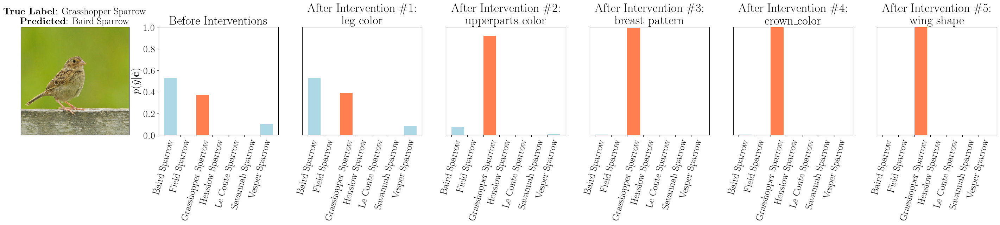

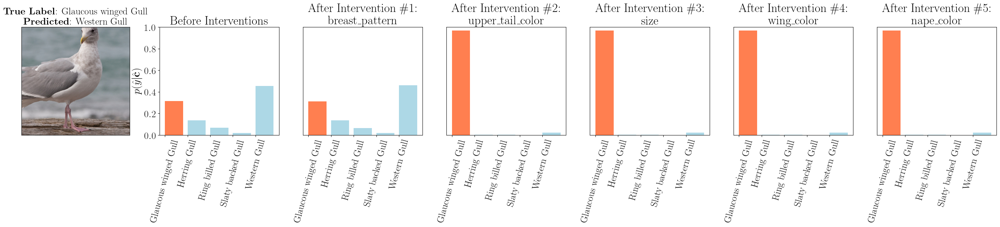

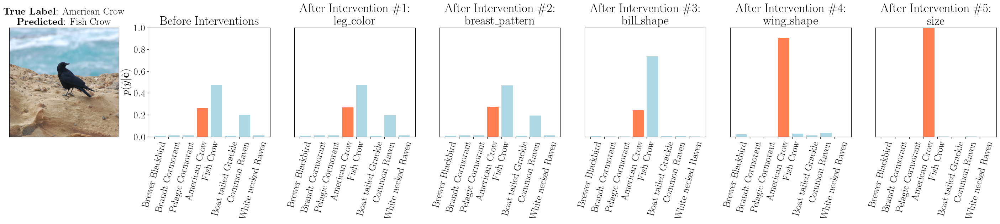

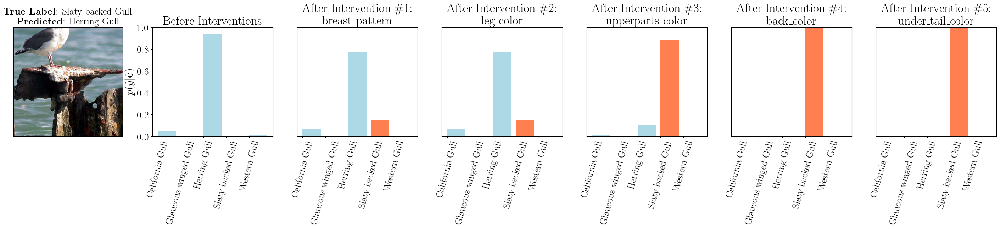

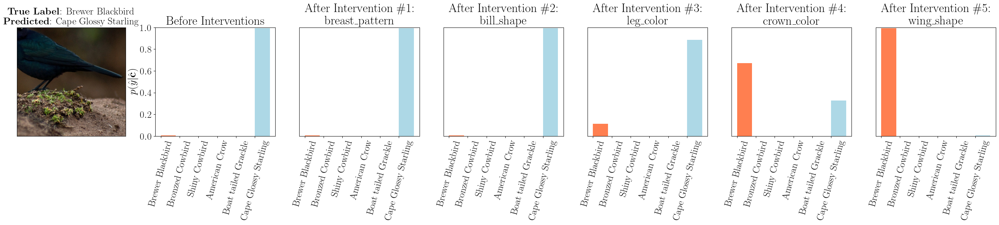

...

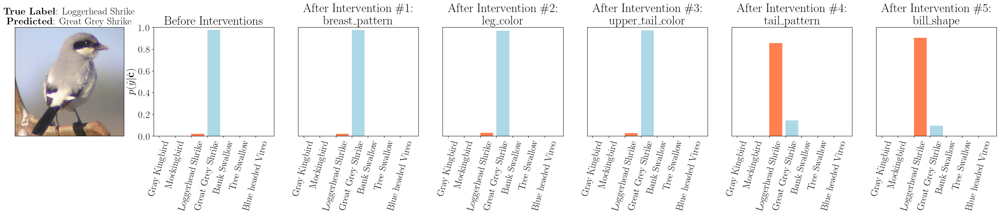

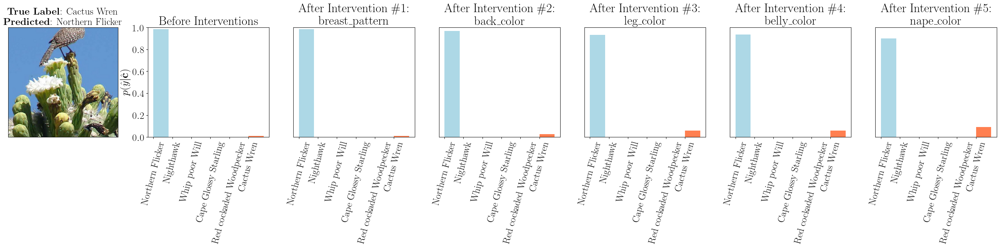

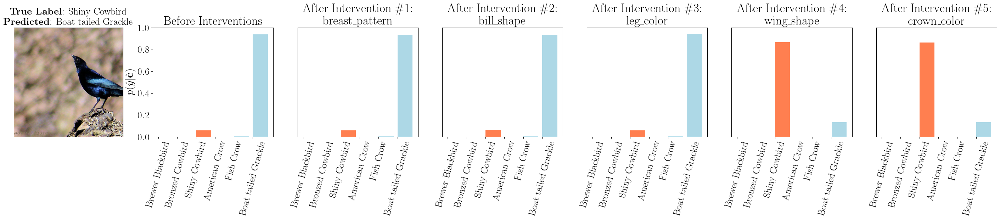

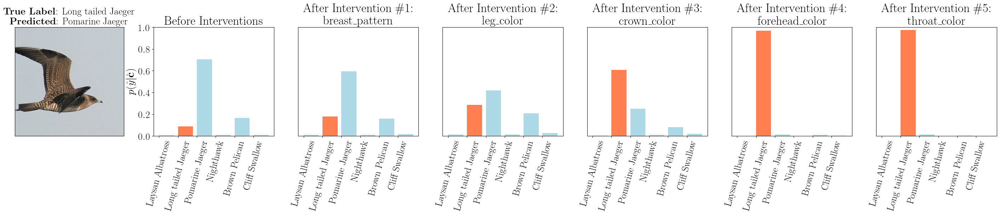

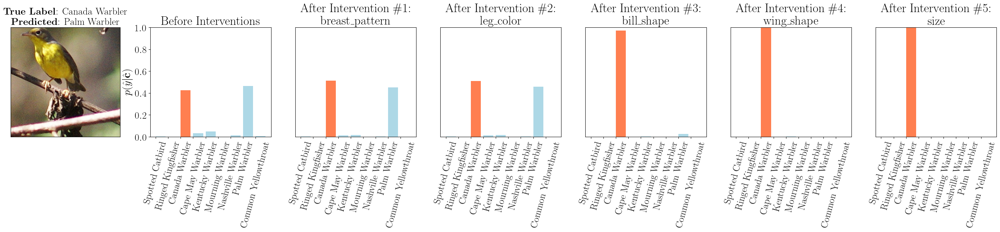

In [127]:
import matplotlib as mpl

mpl.rcParams.update(mpl.rcParamsDefault)

plt.rcParams["font.family"] = "serif"
rc('text',usetex=True)
rc('text.latex', preamble=r"\usepackage{color}" + "\n" + r"\definecolor{coral}{RGB}{255,127,80}" + "\n" + r"\definecolor{lightblue}{RGB}{173,216,230}")

from scipy.special import softmax
examples = 200
int_steps = 6
seen_classes = 5
np.random.seed(42)
selected_idxs = np.random.choice(list(range(x_test.shape[0])), size=examples)

# First find out which class labels we will include in our diagram for
# each test example
used_task_labels = []
for idx in selected_idxs:
    current_best = set()
    for int_step in range(int_steps):
        best_idxs = np.argpartition(posterior_distrs[int_step][idx], -seen_classes)[-seen_classes:]
        current_best.update(best_idxs)
    used_task_labels.append(sorted(list(current_best)))

for used_labels, idx in zip(used_task_labels, selected_idxs):
    pred_label = np.argmax(posterior_distrs[0][idx])
    real_label = y_test[idx]
    if pred_label == real_label or (
        np.argmax(posterior_distrs[int_steps][idx], axis=-1) != real_label
    ):
        continue
    fig, axs = plt.subplots(
        1,
        int_steps + 1,
        figsize=(int_steps*6, 4),
        squeeze=False,
        # constrained_layout=True,
    )
    ax = axs[0, 0]
    title = (
        r"\textbf{True Label}: \textcolor{red}{" +
        f"{CLASS_NAMES[y_test[idx]].replace('_', ' ')}" +
        "}\n" +
        r"\textbf{Predicted}: \textcolor{blue}{" +
        f"{CLASS_NAMES[pred_label].replace('_', ' ')}" +
        r"}"

    )
    pred_label = CLASS_NAMES[pred_label].replace('_', ' ')
    print(title)
    ax.set_title(title, fontsize=20)
    ax.imshow(x_test[idx].transpose(0, 2).transpose(0, 1).detach().numpy()*2 + 0.5)
    ax.grid(False)
    ax.set_xticks([])
    ax.set_yticks([])
    colors = ['lightblue' if i != real_label else 'coral' for i in used_labels]

    for int_step in range(int_steps):
        used_seen_classes = len(used_labels)
        y_distr = softmax(posterior_distrs[int_step][idx])[used_labels]
        ax = axs[0, int_step + 1]
        print('\t', y_distr)
        if int_step > 0:
            concepts_intervened = prev_interventions_accum[int_step][idx, :] - prev_interventions_accum[int_step - 1][idx, :]
            for i, val in enumerate(concepts_intervened):
                if val == 1:
                    concept_group = np.array(cub_data_module.CONCEPT_SEMANTICS)[cub_data_module.SELECTED_CONCEPTS][i]
                    concept_group = concept_group[:concept_group.find("::")]
                    group_idxs = concept_map[concept_group]
                    concept_group = concept_group[len("has_"):]
                    break
            print("Intervened on concept group:", concept_group)
            ground_truth_concept_idx = np.argmax(c_test[idx, group_idxs])
            pred_concept = c_preds[int_step - 1][idx, group_idxs][ground_truth_concept_idx]
            print("\tSelected ground truth concept had probability of selection", pred_concept, "given", len(group_idxs), "concepts in the group")
            ax.set_title(f"After Intervention \#{int_step}:\n{concept_group}", fontsize=25) #\n(conf {pred_concept:.2f})", fontsize=20)
        else:
            ax.set_title(f"Before Interventions", fontsize=25)

        ax.bar(list(range(1, used_seen_classes + 1)), y_distr, align='edge', color=colors, linewidth=1)
        ax.set_xticks(list(range(1, used_seen_classes + 1)), rotation=90)
        label_names = list(map(
            lambda x: x.replace("_", " "),
            np.array(CLASS_NAMES)[used_labels]
        ))
        ax.set_xticklabels(label_names, rotation=75)
        ax.grid(False)
        ax.xaxis.set_tick_params(labelsize=20)
        ax.yaxis.set_tick_params(labelsize=20)
        ax.set_ylim(0, 1)
        if int_step == 0:
            ax.set_ylabel("$p(\hat{y} | \hat{\mathbf{c}})$", fontsize=22)
        else:
            ax.set_yticks([])
        # ax.set_xlabel("Task Label", fontsize=20)
        print("\tAt int_step", int_step, "the current predicted class is", np.argmax(posterior_distrs[int_step][idx]), "when the ground truth is", y_test[idx])
    # fig.tight_layout()
    # plt.subplots_adjust(wspace=0.8)
    fig.show()
    plt.savefig(f"figures/examples/intcem_policy_with_test_idx_{idx}_split_{split}.pdf", bbox_inches='tight')
    plt.savefig(f"figures/examples/intcem_policy_with_test_idx_{idx}_split_{split}.png", bbox_inches='tight')


c_pred[idx, concept_map[group]] = [9.2175445e-03 9.0174526e-01 1.2912946e-04 2.4087347e-02 1.6743566e-01
 1.9794428e-03]
c_test[idx, concept_map[group]] = tensor([0., 0., 0., 0., 0., 0.])
(c_pred[idx, concept_map[group]] >= 0.5).astype(np.int32) == c_test[idx, concept_map[group]] = False


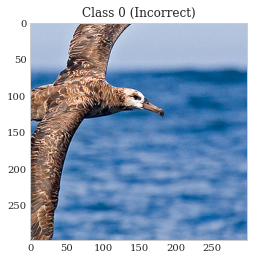

c_pred[idx, concept_map[group]] = [2.69025285e-03 4.77757268e-02 1.47546625e-05 3.73755097e-02
 2.23616185e-03 1.97290101e-05]
c_test[idx, concept_map[group]] = tensor([0., 0., 0., 0., 0., 0.])
(c_pred[idx, concept_map[group]] >= 0.5).astype(np.int32) == c_test[idx, concept_map[group]] = False


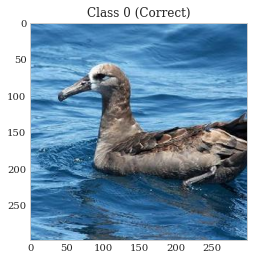

c_pred[idx, concept_map[group]] = [2.2657844e-03 3.0009633e-01 6.3123593e-06 4.1287407e-02 2.3938058e-01
 4.7081965e-05]
c_test[idx, concept_map[group]] = tensor([0., 0., 0., 0., 0., 0.])
(c_pred[idx, concept_map[group]] >= 0.5).astype(np.int32) == c_test[idx, concept_map[group]] = False


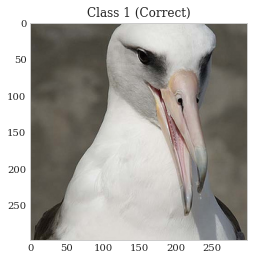

c_pred[idx, concept_map[group]] = [6.6874260e-03 7.2807360e-01 8.8833758e-06 3.3092993e-01 1.7091157e-02
 3.2067139e-05]
c_test[idx, concept_map[group]] = tensor([0., 0., 0., 0., 0., 0.])
(c_pred[idx, concept_map[group]] >= 0.5).astype(np.int32) == c_test[idx, concept_map[group]] = False


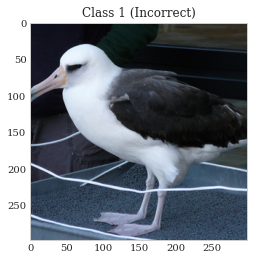

c_pred[idx, concept_map[group]] = [1.1578865e-04 9.6706420e-01 5.9200379e-06 7.3687653e-03 4.5719898e-01
 3.6706726e-06]
c_test[idx, concept_map[group]] = tensor([0., 0., 0., 0., 0., 0.])
(c_pred[idx, concept_map[group]] >= 0.5).astype(np.int32) == c_test[idx, concept_map[group]] = False


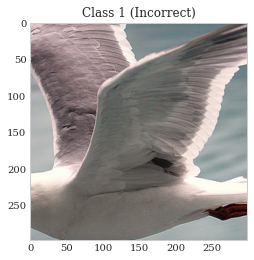

c_pred[idx, concept_map[group]] = [5.7408819e-03 2.4671941e-01 4.9282203e-06 1.7045057e-01 1.4011951e-01
 1.4472405e-04]
c_test[idx, concept_map[group]] = tensor([0., 0., 0., 0., 0., 0.])
(c_pred[idx, concept_map[group]] >= 0.5).astype(np.int32) == c_test[idx, concept_map[group]] = False


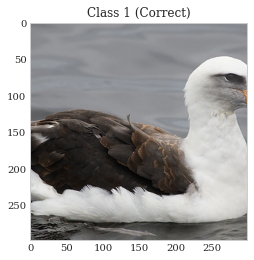

c_pred[idx, concept_map[group]] = [1.4604575e-03 4.0098310e-01 6.0642026e-07 1.3888864e-01 1.1101607e-03
 2.8051201e-05]
c_test[idx, concept_map[group]] = tensor([0., 0., 0., 0., 0., 0.])
(c_pred[idx, concept_map[group]] >= 0.5).astype(np.int32) == c_test[idx, concept_map[group]] = False


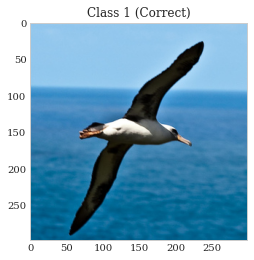

c_pred[idx, concept_map[group]] = [1.0300865e-02 1.5494132e-01 9.2711001e-05 1.4209472e-01 2.6321094e-02
 6.7630707e-04]
c_test[idx, concept_map[group]] = tensor([0., 0., 0., 0., 0., 0.])
(c_pred[idx, concept_map[group]] >= 0.5).astype(np.int32) == c_test[idx, concept_map[group]] = False


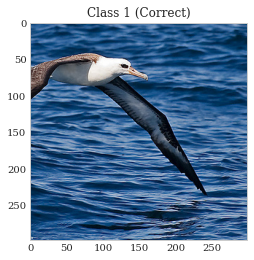

c_pred[idx, concept_map[group]] = [1.3884979e-04 2.0569293e-01 2.5996891e-07 1.0167661e-02 3.3203948e-01
 2.5868439e-06]
c_test[idx, concept_map[group]] = tensor([0., 0., 0., 0., 0., 0.])
(c_pred[idx, concept_map[group]] >= 0.5).astype(np.int32) == c_test[idx, concept_map[group]] = False


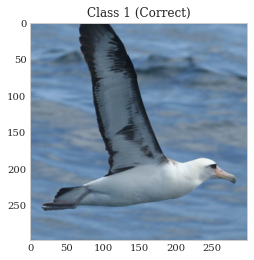

c_pred[idx, concept_map[group]] = [3.3137939e-04 2.6401249e-01 1.2335515e-05 9.1845997e-02 2.3523718e-01
 2.1660555e-05]
c_test[idx, concept_map[group]] = tensor([0., 0., 0., 0., 0., 0.])
(c_pred[idx, concept_map[group]] >= 0.5).astype(np.int32) == c_test[idx, concept_map[group]] = False


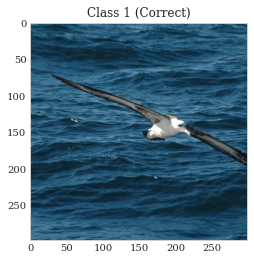

c_pred[idx, concept_map[group]] = [5.7079835e-04 4.2303798e-01 1.5168532e-05 4.4418126e-02 3.5693464e-01
 2.2272507e-05]
c_test[idx, concept_map[group]] = tensor([0., 1., 0., 0., 0., 0.])
(c_pred[idx, concept_map[group]] >= 0.5).astype(np.int32) == c_test[idx, concept_map[group]] = False


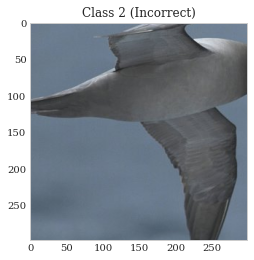

c_pred[idx, concept_map[group]] = [3.0142764e-04 4.3011481e-01 1.0865700e-05 2.3573253e-01 4.5164339e-03
 3.0676296e-05]
c_test[idx, concept_map[group]] = tensor([0., 1., 0., 0., 0., 0.])
(c_pred[idx, concept_map[group]] >= 0.5).astype(np.int32) == c_test[idx, concept_map[group]] = False


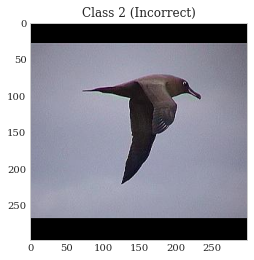

c_pred[idx, concept_map[group]] = [1.4236206e-04 9.3564337e-01 1.4528829e-06 2.9157701e-01 1.7561181e-02
 6.9462271e-06]
c_test[idx, concept_map[group]] = tensor([0., 1., 0., 0., 0., 0.])
(c_pred[idx, concept_map[group]] >= 0.5).astype(np.int32) == c_test[idx, concept_map[group]] = False


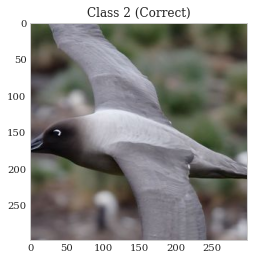

In [116]:
c_pred = np.concatenate(
    list(map(lambda x: x[0].detach().cpu().numpy(), test_batch_results)),
    axis=0,
)

group = 'has_wing_color'
class_distr = np.zeros(200)
for idx in range(x_test.shape[0]):
    if np.all(prev_interventions_accum[1][idx, concept_map[group]] == 1):
        if idx < 100:
            print("c_pred[idx, concept_map[group]] =", c_pred[idx, concept_map[group]])
            print("c_test[idx, concept_map[group]] =", c_test[idx, concept_map[group]])
            print("(c_pred[idx, concept_map[group]] >= 0.5).astype(np.int32) == c_test[idx, concept_map[group]] =", (c_pred[idx, concept_map[group]] >= 0.5).astype(np.int32) == c_test[idx, concept_map[group]])
            if np.all((c_pred[idx, concept_map[group]] >= 0.5).astype(np.int32) == c_test[idx, concept_map[group]].detach().cpu().numpy()):
                extra = "Correct"
            else:
                extra = "Incorrect"
            plt.title(f"Class {y_test[idx]} ({extra})")
            plt.imshow(x_test[idx].transpose(0, 2).transpose(0, 1).detach().numpy()*2 + 0.5)
            plt.grid(False)
            plt.show()
        class_distr[y_test[idx]] += 1


In [67]:
class_distr

array([15., 12., 19.,  9.,  4.,  2.,  0., 17.,  6.,  0.,  5.,  1.,  1.,
       20.,  8.,  5.,  2.,  6.,  5.,  5.,  3., 19., 14., 11., 19.,  5.,
        6.,  3.,  4.,  9.,  4.,  5.,  4.,  1.,  2.,  1.,  7.,  5.,  6.,
        6., 10., 15., 10., 14.,  5.,  3.,  2.,  0.,  9., 14.,  3.,  5.,
        2., 21.,  0.,  7.,  0.,  6.,  4.,  2.,  2.,  4., 28.,  6.,  3.,
        4.,  6.,  9.,  4.,  6., 19., 21.,  8.,  9.,  4.,  3.,  5.,  4.,
        2.,  7.,  3.,  3.,  0.,  3., 24., 18.,  0.,  0.,  2.,  6.,  2.,
        3.,  0.,  0.,  1.,  0.,  5.,  3.,  9., 12.,  3.,  5.,  8.,  1.,
       10.,  7.,  3., 12.,  2.,  7.,  4.,  3.,  0.,  1.,  5., 18.,  6.,
        4.,  7.,  0.,  3.,  1.,  2.,  0.,  0.,  2.,  2.,  2.,  1., 14.,
        3.,  1.,  0., 15., 11.,  9.,  4.,  5., 10., 29.,  5., 16., 20.,
       13., 19., 13.,  5.,  4.,  1.,  0.,  2.,  1.,  6.,  6., 10.,  1.,
       11.,  1.,  0.,  5., 14.,  0.,  1.,  1.,  1.,  0.,  1.,  1.,  0.,
        3.,  3.,  5., 14.,  6.,  2.,  1., 12.,  3.,  4.,  2.,  8

In [70]:
np.mean(torch.nn.functional.one_hot(y_test).detach().cpu().numpy(), axis=0)

array([0.00517777, 0.00517777, 0.00483259, 0.00517777, 0.00241629,
       0.00189852, 0.00396962, 0.00310666, 0.00500518, 0.00517777,
       0.00517777, 0.0044874 , 0.00517777, 0.00517777, 0.00483259,
       0.00483259, 0.00465999, 0.00258889, 0.00500518, 0.00500518,
       0.00517777, 0.0044874 , 0.00500518, 0.00379703, 0.00517777,
       0.00517777, 0.00517777, 0.00500518, 0.00517777, 0.00517777,
       0.00517777, 0.00396962, 0.00500518, 0.00500518, 0.00517777,
       0.00517777, 0.00500518, 0.00517777, 0.00500518, 0.00517777,
       0.00517777, 0.00517777, 0.00500518, 0.00517777, 0.00517777,
       0.00517777, 0.00517777, 0.00517777, 0.00517777, 0.00517777,
       0.00517777, 0.00517777, 0.00517777, 0.00517777, 0.00517777,
       0.00517777, 0.00517777, 0.00483259, 0.00517777, 0.00500518,
       0.00517777, 0.00517777, 0.00517777, 0.00517777, 0.00345185,
       0.00517777, 0.00517777, 0.00517777, 0.00517777, 0.00517777,
       0.00517777, 0.00517777, 0.00517777, 0.00517777, 0.00465

In [61]:
from sklearn.metrics import roc_auc_score   
c_pred = np.concatenate(
    list(map(lambda x: x[0].detach().cpu().numpy(), test_batch_results)),
    axis=0,
)
concept_acc = np.zeros((n_concepts,))
for i in range(n_concepts):
    concept_acc[i] = roc_auc_score(c_test.detach().cpu().numpy()[:,i], c_pred[:,i])
# concept_acc = np.mean((c_pred > 0.5) == c_test.detach().cpu().numpy(), axis=0)
group_concept_acc = np.zeros(len(concept_map))
for group, (_, concepts) in enumerate(concept_map.items()):
    print(group, _, concepts)
    group_concept_acc[group] = np.mean(concept_acc[concepts])
group_concept_acc

0 has_bill_shape [0, 1, 2, 3]
1 has_wing_color [4, 5, 6, 7, 8, 9]
2 has_upperparts_color [10, 11, 12, 13, 14, 15]
3 has_underparts_color [16, 17, 18, 19, 20, 21]
4 has_breast_pattern [22, 23, 24]
5 has_back_color [25, 26, 27, 28, 29, 30]
6 has_tail_shape [31]
7 has_upper_tail_color [32, 33, 34, 35, 36]
8 has_head_pattern [37, 38]
9 has_breast_color [39, 40, 41, 42, 43, 44]
10 has_throat_color [45, 46, 47, 48, 49]
11 has_eye_color [50]
12 has_bill_length [51, 52]
13 has_forehead_color [53, 54, 55, 56, 57, 58]
14 has_under_tail_color [59, 60, 61, 62, 63]
15 has_nape_color [64, 65, 66, 67, 68, 69]
16 has_belly_color [70, 71, 72, 73, 74, 75]
17 has_wing_shape [76, 77]
18 has_size [78, 79, 80]
19 has_shape [81, 82]
20 has_back_pattern [83, 84, 85]
21 has_tail_pattern [86, 87, 88]
22 has_belly_pattern [89]
23 has_primary_color [90, 91, 92, 93, 94, 95]
24 has_leg_color [96, 97, 98]
25 has_bill_color [99, 100, 101]
26 has_crown_color [102, 103, 104, 105, 106, 107]
27 has_wing_pattern [108, 109

array([0.98739552, 0.98538578, 0.9850541 , 0.98642661, 0.97777572,
       0.98691136, 0.97579747, 0.9836056 , 0.98719266, 0.98677152,
       0.98671823, 0.13623097, 0.97324845, 0.98908565, 0.98230351,
       0.98663065, 0.98897196, 0.97063512, 0.97432392, 0.99526718,
       0.97961606, 0.97831179, 0.86664037, 0.98838558, 0.98114945,
       0.9801203 , 0.98915908, 0.98336868])

In [109]:
import pytorch_lightning as pl
import time
from cem.interventions.coop import CooP
from cem.interventions.uncertainty import UncertaintyMaximizerPolicy
from cem.interventions.optimal import GreedyOptimal
def competence_generator(
    x,
    y,
    c,
    concept_group_map,
):
    return np.ones(c.shape)

coop_total_times = []
coop_val_distribution = np.zeros((len(concept_map) + 1, n_concepts))
prev_interventions = None
intcem.intervention_policy = CooP(
    cbm=intcem,
    concept_group_map=concept_map,
    num_groups_intervened=0,
    group_based=True,
    include_prior=False,
    concept_entropy_weight=0.1,
    importance_weight=100,
    acquisition_weight=0,
    n_tasks=n_tasks,
    n_concepts=n_concepts,
)
# intcem.intervention_policy = UncertaintyMaximizerPolicy(
#     cbm=intcem,
#     concept_group_map=concept_map,
#     num_groups_intervened=0,
#     group_based=True,
#     include_prior=False,
# )
trainer = pl.Trainer(
    gpus=1,
    logger=False,
)
# Now include the competence that we will assume
# for all concepts
if hasattr(test_dl.dataset, 'tensors'):
    x_test, y_test, c_test = test_dl.dataset.tensors[:3]
else:
    x_test, y_test, c_test = [], [], []
    for data in test_dl:
        if len(data) == 2:
            x, (y, c) = data
        else:
            (x, y, c) = data
        x_type = x.type()
        y_type = y.type()
        c_type = c.type()
        x_test.append(x)
        y_test.append(y)
        c_test.append(c)
    x_test = torch.FloatTensor(
        np.concatenate(x_test, axis=0)
    ).type(x_type)
    y_test = torch.FloatTensor(
        np.concatenate(y_test, axis=0)
    ).type(y_type)
    c_test = torch.FloatTensor(
        np.concatenate(c_test, axis=0)
    ).type(c_type)

competencies_test = competence_generator(
    x=x_test,
    y=y_test,
    c=c_test,
    concept_group_map=concept_map,
)
c_test = concepts_from_competencies(c_test, competencies_test)
competencies_test = torch.FloatTensor(competencies_test)
np.random.seed(42)
test_dl = torch.utils.data.DataLoader(
    dataset=torch.utils.data.TensorDataset(
        x_test,
        y_test,
        c_test,
        competencies_test,
    ),
    batch_size=test_dl.batch_size,
    num_workers=test_dl.num_workers,
)
prev_num_groups_intervened = 0
coop_intervention_accs = []
for j, num_groups_intervened in enumerate(range(len(concept_map) + 1)):
    ####
    # Set the model's intervention policy
    ####
    intcem.intervention_policy.num_groups_intervened = (
        num_groups_intervened - prev_num_groups_intervened
    )
    start_time = time.time()
    test_batch_results = trainer.predict(
        intcem,
        test_dl,
    )
    y_pred = np.concatenate(
        list(map(lambda x: x[2].detach().cpu().numpy(), test_batch_results)),
        axis=0,
    )
    coop_total_times.append((time.time() - start_time)/(y_pred.shape[0]))
    y_pred = np.argmax(y_pred, axis=-1)
    prev_interventions = np.concatenate(
        list(map(lambda x: x[3].detach().cpu().numpy(), test_batch_results)),
        axis=0,
    )
    acc = np.mean(y_pred == y_test.detach().cpu().numpy())
    coop_intervention_accs.append(acc)
    print("With CooP", num_groups_intervened, "we have", coop_intervention_accs)

    # And generate the next dataset so that we can reuse previous
    # interventions on the same samples in the future to save time
    if num_groups_intervened != 0:
        coop_val_distribution[num_groups_intervened, :] = np.sum(
            prev_interventions,
            axis=0,
        )
    prev_num_groups_intervened = num_groups_intervened
    test_dl = torch.utils.data.DataLoader(
        dataset=torch.utils.data.TensorDataset(
            x_test,
            y_test,
            c_test,
            competencies_test,
            torch.IntTensor(prev_interventions),
        ),
        batch_size=test_dl.batch_size,
        num_workers=test_dl.num_workers,
    )

GPU available: True, used: True
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
IPU available: False, using: 0 IPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With CooP 0 we have [0.7568173973075596]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With CooP 1 we have [0.7568173973075596, 0.8123921297894373]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With CooP 2 we have [0.7568173973075596, 0.8123921297894373, 0.8576113220573006]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With CooP 3 we have [0.7568173973075596, 0.8123921297894373, 0.8576113220573006, 0.8905764584052468]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With CooP 4 we have [0.7568173973075596, 0.8123921297894373, 0.8576113220573006, 0.8905764584052468, 0.9140490162236796]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With CooP 5 we have [0.7568173973075596, 0.8123921297894373, 0.8576113220573006, 0.8905764584052468, 0.9140490162236796, 0.9325163962720056]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With CooP 6 we have [0.7568173973075596, 0.8123921297894373, 0.8576113220573006, 0.8905764584052468, 0.9140490162236796, 0.9325163962720056, 0.9523645150155333]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With CooP 7 we have [0.7568173973075596, 0.8123921297894373, 0.8576113220573006, 0.8905764584052468, 0.9140490162236796, 0.9325163962720056, 0.9523645150155333, 0.9630652399033482]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With CooP 8 we have [0.7568173973075596, 0.8123921297894373, 0.8576113220573006, 0.8905764584052468, 0.9140490162236796, 0.9325163962720056, 0.9523645150155333, 0.9630652399033482, 0.9727304107697619]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With CooP 9 we have [0.7568173973075596, 0.8123921297894373, 0.8576113220573006, 0.8905764584052468, 0.9140490162236796, 0.9325163962720056, 0.9523645150155333, 0.9630652399033482, 0.9727304107697619, 0.9806696582671729]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With CooP 10 we have [0.7568173973075596, 0.8123921297894373, 0.8576113220573006, 0.8905764584052468, 0.9140490162236796, 0.9325163962720056, 0.9523645150155333, 0.9630652399033482, 0.9727304107697619, 0.9806696582671729, 0.9867103900586814]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With CooP 11 we have [0.7568173973075596, 0.8123921297894373, 0.8576113220573006, 0.8905764584052468, 0.9140490162236796, 0.9325163962720056, 0.9523645150155333, 0.9630652399033482, 0.9727304107697619, 0.9806696582671729, 0.9867103900586814, 0.9906800138073869]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With CooP 12 we have [0.7568173973075596, 0.8123921297894373, 0.8576113220573006, 0.8905764584052468, 0.9140490162236796, 0.9325163962720056, 0.9523645150155333, 0.9630652399033482, 0.9727304107697619, 0.9806696582671729, 0.9867103900586814, 0.9906800138073869, 0.9944770452191922]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With CooP 13 we have [0.7568173973075596, 0.8123921297894373, 0.8576113220573006, 0.8905764584052468, 0.9140490162236796, 0.9325163962720056, 0.9523645150155333, 0.9630652399033482, 0.9727304107697619, 0.9806696582671729, 0.9867103900586814, 0.9906800138073869, 0.9944770452191922, 0.9962029685881947]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With CooP 14 we have [0.7568173973075596, 0.8123921297894373, 0.8576113220573006, 0.8905764584052468, 0.9140490162236796, 0.9325163962720056, 0.9523645150155333, 0.9630652399033482, 0.9727304107697619, 0.9806696582671729, 0.9867103900586814, 0.9906800138073869, 0.9944770452191922, 0.9962029685881947, 0.9975837072833966]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With CooP 15 we have [0.7568173973075596, 0.8123921297894373, 0.8576113220573006, 0.8905764584052468, 0.9140490162236796, 0.9325163962720056, 0.9523645150155333, 0.9630652399033482, 0.9727304107697619, 0.9806696582671729, 0.9867103900586814, 0.9906800138073869, 0.9944770452191922, 0.9962029685881947, 0.9975837072833966, 0.9977562996202969]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With CooP 16 we have [0.7568173973075596, 0.8123921297894373, 0.8576113220573006, 0.8905764584052468, 0.9140490162236796, 0.9325163962720056, 0.9523645150155333, 0.9630652399033482, 0.9727304107697619, 0.9806696582671729, 0.9867103900586814, 0.9906800138073869, 0.9944770452191922, 0.9962029685881947, 0.9975837072833966, 0.9977562996202969, 0.9979288919571971]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With CooP 17 we have [0.7568173973075596, 0.8123921297894373, 0.8576113220573006, 0.8905764584052468, 0.9140490162236796, 0.9325163962720056, 0.9523645150155333, 0.9630652399033482, 0.9727304107697619, 0.9806696582671729, 0.9867103900586814, 0.9906800138073869, 0.9944770452191922, 0.9962029685881947, 0.9975837072833966, 0.9977562996202969, 0.9979288919571971, 0.9982740766309975]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With CooP 18 we have [0.7568173973075596, 0.8123921297894373, 0.8576113220573006, 0.8905764584052468, 0.9140490162236796, 0.9325163962720056, 0.9523645150155333, 0.9630652399033482, 0.9727304107697619, 0.9806696582671729, 0.9867103900586814, 0.9906800138073869, 0.9944770452191922, 0.9962029685881947, 0.9975837072833966, 0.9977562996202969, 0.9979288919571971, 0.9982740766309975, 0.9987918536416983]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With CooP 19 we have [0.7568173973075596, 0.8123921297894373, 0.8576113220573006, 0.8905764584052468, 0.9140490162236796, 0.9325163962720056, 0.9523645150155333, 0.9630652399033482, 0.9727304107697619, 0.9806696582671729, 0.9867103900586814, 0.9906800138073869, 0.9944770452191922, 0.9962029685881947, 0.9975837072833966, 0.9977562996202969, 0.9979288919571971, 0.9982740766309975, 0.9987918536416983, 0.9987918536416983]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With CooP 20 we have [0.7568173973075596, 0.8123921297894373, 0.8576113220573006, 0.8905764584052468, 0.9140490162236796, 0.9325163962720056, 0.9523645150155333, 0.9630652399033482, 0.9727304107697619, 0.9806696582671729, 0.9867103900586814, 0.9906800138073869, 0.9944770452191922, 0.9962029685881947, 0.9975837072833966, 0.9977562996202969, 0.9979288919571971, 0.9982740766309975, 0.9987918536416983, 0.9987918536416983, 0.9991370383154988]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With CooP 21 we have [0.7568173973075596, 0.8123921297894373, 0.8576113220573006, 0.8905764584052468, 0.9140490162236796, 0.9325163962720056, 0.9523645150155333, 0.9630652399033482, 0.9727304107697619, 0.9806696582671729, 0.9867103900586814, 0.9906800138073869, 0.9944770452191922, 0.9962029685881947, 0.9975837072833966, 0.9977562996202969, 0.9979288919571971, 0.9982740766309975, 0.9987918536416983, 0.9987918536416983, 0.9991370383154988, 0.9991370383154988]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With CooP 22 we have [0.7568173973075596, 0.8123921297894373, 0.8576113220573006, 0.8905764584052468, 0.9140490162236796, 0.9325163962720056, 0.9523645150155333, 0.9630652399033482, 0.9727304107697619, 0.9806696582671729, 0.9867103900586814, 0.9906800138073869, 0.9944770452191922, 0.9962029685881947, 0.9975837072833966, 0.9977562996202969, 0.9979288919571971, 0.9982740766309975, 0.9987918536416983, 0.9987918536416983, 0.9991370383154988, 0.9991370383154988, 0.9991370383154988]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With CooP 23 we have [0.7568173973075596, 0.8123921297894373, 0.8576113220573006, 0.8905764584052468, 0.9140490162236796, 0.9325163962720056, 0.9523645150155333, 0.9630652399033482, 0.9727304107697619, 0.9806696582671729, 0.9867103900586814, 0.9906800138073869, 0.9944770452191922, 0.9962029685881947, 0.9975837072833966, 0.9977562996202969, 0.9979288919571971, 0.9982740766309975, 0.9987918536416983, 0.9987918536416983, 0.9991370383154988, 0.9991370383154988, 0.9991370383154988, 0.9991370383154988]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With CooP 24 we have [0.7568173973075596, 0.8123921297894373, 0.8576113220573006, 0.8905764584052468, 0.9140490162236796, 0.9325163962720056, 0.9523645150155333, 0.9630652399033482, 0.9727304107697619, 0.9806696582671729, 0.9867103900586814, 0.9906800138073869, 0.9944770452191922, 0.9962029685881947, 0.9975837072833966, 0.9977562996202969, 0.9979288919571971, 0.9982740766309975, 0.9987918536416983, 0.9987918536416983, 0.9991370383154988, 0.9991370383154988, 0.9991370383154988, 0.9991370383154988, 0.9991370383154988]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With CooP 25 we have [0.7568173973075596, 0.8123921297894373, 0.8576113220573006, 0.8905764584052468, 0.9140490162236796, 0.9325163962720056, 0.9523645150155333, 0.9630652399033482, 0.9727304107697619, 0.9806696582671729, 0.9867103900586814, 0.9906800138073869, 0.9944770452191922, 0.9962029685881947, 0.9975837072833966, 0.9977562996202969, 0.9979288919571971, 0.9982740766309975, 0.9987918536416983, 0.9987918536416983, 0.9991370383154988, 0.9991370383154988, 0.9991370383154988, 0.9991370383154988, 0.9991370383154988, 0.9991370383154988]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With CooP 26 we have [0.7568173973075596, 0.8123921297894373, 0.8576113220573006, 0.8905764584052468, 0.9140490162236796, 0.9325163962720056, 0.9523645150155333, 0.9630652399033482, 0.9727304107697619, 0.9806696582671729, 0.9867103900586814, 0.9906800138073869, 0.9944770452191922, 0.9962029685881947, 0.9975837072833966, 0.9977562996202969, 0.9979288919571971, 0.9982740766309975, 0.9987918536416983, 0.9987918536416983, 0.9991370383154988, 0.9991370383154988, 0.9991370383154988, 0.9991370383154988, 0.9991370383154988, 0.9991370383154988, 0.9991370383154988]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With CooP 27 we have [0.7568173973075596, 0.8123921297894373, 0.8576113220573006, 0.8905764584052468, 0.9140490162236796, 0.9325163962720056, 0.9523645150155333, 0.9630652399033482, 0.9727304107697619, 0.9806696582671729, 0.9867103900586814, 0.9906800138073869, 0.9944770452191922, 0.9962029685881947, 0.9975837072833966, 0.9977562996202969, 0.9979288919571971, 0.9982740766309975, 0.9987918536416983, 0.9987918536416983, 0.9991370383154988, 0.9991370383154988, 0.9991370383154988, 0.9991370383154988, 0.9991370383154988, 0.9991370383154988, 0.9991370383154988, 0.9991370383154988]


Predicting: 0it [00:00, ?it/s]

With CooP 28 we have [0.7568173973075596, 0.8123921297894373, 0.8576113220573006, 0.8905764584052468, 0.9140490162236796, 0.9325163962720056, 0.9523645150155333, 0.9630652399033482, 0.9727304107697619, 0.9806696582671729, 0.9867103900586814, 0.9906800138073869, 0.9944770452191922, 0.9962029685881947, 0.9975837072833966, 0.9977562996202969, 0.9979288919571971, 0.9982740766309975, 0.9987918536416983, 0.9987918536416983, 0.9991370383154988, 0.9991370383154988, 0.9991370383154988, 0.9991370383154988, 0.9991370383154988, 0.9991370383154988, 0.9991370383154988, 0.9991370383154988, 0.9991370383154988]


In [110]:
import pytorch_lightning as pl
from cem.interventions.coop import CooP
from cem.interventions.uncertainty import UncertaintyMaximizerPolicy
from cem.interventions.optimal import GreedyOptimal
def competence_generator(
    x,
    y,
    c,
    concept_group_map,
):
    return np.ones(c.shape)

greedy_total_times = []
greedy_val_distribution = np.zeros((len(concept_map) + 1, n_concepts))
prev_interventions = None
intcem.intervention_policy = GreedyOptimal(
    cbm=intcem,
    concept_group_map=concept_map,
    num_groups_intervened=0,
    group_based=True,
    include_prior=False,
    n_tasks=n_tasks,
    n_concepts=n_concepts,
)
trainer = pl.Trainer(
    gpus=1,
    logger=False,
)
# Now include the competence that we will assume
# for all concepts
if hasattr(test_dl.dataset, 'tensors'):
    x_test, y_test, c_test = test_dl.dataset.tensors[:3]
else:
    x_test, y_test, c_test = [], [], []
    for data in test_dl:
        if len(data) == 2:
            x, (y, c) = data
        else:
            (x, y, c) = data
        x_type = x.type()
        y_type = y.type()
        c_type = c.type()
        x_test.append(x)
        y_test.append(y)
        c_test.append(c)
    x_test = torch.FloatTensor(
        np.concatenate(x_test, axis=0)
    ).type(x_type)
    y_test = torch.FloatTensor(
        np.concatenate(y_test, axis=0)
    ).type(y_type)
    c_test = torch.FloatTensor(
        np.concatenate(c_test, axis=0)
    ).type(c_type)

competencies_test = competence_generator(
    x=x_test,
    y=y_test,
    c=c_test,
    concept_group_map=concept_map,
)
c_test = concepts_from_competencies(c_test, competencies_test)
competencies_test = torch.FloatTensor(competencies_test)
np.random.seed(42)
test_dl = torch.utils.data.DataLoader(
    dataset=torch.utils.data.TensorDataset(
        x_test,
        y_test,
        c_test,
        competencies_test,
    ),
    batch_size=test_dl.batch_size,
    num_workers=test_dl.num_workers,
)
prev_num_groups_intervened = 0
greedy_intervention_accs = []
for j, num_groups_intervened in enumerate(range(len(concept_map) + 1)):
    ####
    # Set the model's intervention policy
    ####
    intcem.intervention_policy.num_groups_intervened = (
        num_groups_intervened - prev_num_groups_intervened
    )
    start_time = time.time()
    test_batch_results = trainer.predict(
        intcem,
        test_dl,
    )
    y_pred = np.concatenate(
        list(map(lambda x: x[2].detach().cpu().numpy(), test_batch_results)),
        axis=0,
    )
    greedy_total_times.append((time.time() - start_time)/(y_pred.shape[0]))
    y_pred = np.argmax(y_pred, axis=-1)
    prev_interventions = np.concatenate(
        list(map(lambda x: x[3].detach().cpu().numpy(), test_batch_results)),
        axis=0,
    )
    acc = np.mean(y_pred == y_test.detach().cpu().numpy())
    greedy_intervention_accs.append(acc)
    print("With greedy", num_groups_intervened, "we have", greedy_intervention_accs)

    # And generate the next dataset so that we can reuse previous
    # interventions on the same samples in the future to save time
    if num_groups_intervened != 0:
        greedy_val_distribution[num_groups_intervened, :] = np.sum(
            prev_interventions,
            axis=0,
        )
    prev_num_groups_intervened = num_groups_intervened
    test_dl = torch.utils.data.DataLoader(
        dataset=torch.utils.data.TensorDataset(
            x_test,
            y_test,
            c_test,
            competencies_test,
            torch.IntTensor(prev_interventions),
        ),
        batch_size=test_dl.batch_size,
        num_workers=test_dl.num_workers,
    )

GPU available: True, used: True
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
IPU available: False, using: 0 IPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With greedy 0 we have [0.7568173973075596]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With greedy 1 we have [0.7568173973075596, 0.9017949603037625]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With greedy 2 we have [0.7568173973075596, 0.9017949603037625, 0.9563341387642389]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With greedy 3 we have [0.7568173973075596, 0.9017949603037625, 0.9563341387642389, 0.9808422506040732]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With greedy 4 we have [0.7568173973075596, 0.9017949603037625, 0.9563341387642389, 0.9808422506040732, 0.9922333448394891]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With greedy 5 we have [0.7568173973075596, 0.9017949603037625, 0.9563341387642389, 0.9808422506040732, 0.9922333448394891, 0.9972385226095961]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With greedy 6 we have [0.7568173973075596, 0.9017949603037625, 0.9563341387642389, 0.9808422506040732, 0.9922333448394891, 0.9972385226095961, 0.9982740766309975]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With greedy 7 we have [0.7568173973075596, 0.9017949603037625, 0.9563341387642389, 0.9808422506040732, 0.9922333448394891, 0.9972385226095961, 0.9982740766309975, 0.9987918536416983]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With greedy 8 we have [0.7568173973075596, 0.9017949603037625, 0.9563341387642389, 0.9808422506040732, 0.9922333448394891, 0.9972385226095961, 0.9982740766309975, 0.9987918536416983, 0.9991370383154988]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With greedy 9 we have [0.7568173973075596, 0.9017949603037625, 0.9563341387642389, 0.9808422506040732, 0.9922333448394891, 0.9972385226095961, 0.9982740766309975, 0.9987918536416983, 0.9991370383154988, 0.9993096306523991]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With greedy 10 we have [0.7568173973075596, 0.9017949603037625, 0.9563341387642389, 0.9808422506040732, 0.9922333448394891, 0.9972385226095961, 0.9982740766309975, 0.9987918536416983, 0.9991370383154988, 0.9993096306523991, 0.9993096306523991]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With greedy 11 we have [0.7568173973075596, 0.9017949603037625, 0.9563341387642389, 0.9808422506040732, 0.9922333448394891, 0.9972385226095961, 0.9982740766309975, 0.9987918536416983, 0.9991370383154988, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With greedy 12 we have [0.7568173973075596, 0.9017949603037625, 0.9563341387642389, 0.9808422506040732, 0.9922333448394891, 0.9972385226095961, 0.9982740766309975, 0.9987918536416983, 0.9991370383154988, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With greedy 13 we have [0.7568173973075596, 0.9017949603037625, 0.9563341387642389, 0.9808422506040732, 0.9922333448394891, 0.9972385226095961, 0.9982740766309975, 0.9987918536416983, 0.9991370383154988, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With greedy 14 we have [0.7568173973075596, 0.9017949603037625, 0.9563341387642389, 0.9808422506040732, 0.9922333448394891, 0.9972385226095961, 0.9982740766309975, 0.9987918536416983, 0.9991370383154988, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With greedy 15 we have [0.7568173973075596, 0.9017949603037625, 0.9563341387642389, 0.9808422506040732, 0.9922333448394891, 0.9972385226095961, 0.9982740766309975, 0.9987918536416983, 0.9991370383154988, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With greedy 16 we have [0.7568173973075596, 0.9017949603037625, 0.9563341387642389, 0.9808422506040732, 0.9922333448394891, 0.9972385226095961, 0.9982740766309975, 0.9987918536416983, 0.9991370383154988, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With greedy 17 we have [0.7568173973075596, 0.9017949603037625, 0.9563341387642389, 0.9808422506040732, 0.9922333448394891, 0.9972385226095961, 0.9982740766309975, 0.9987918536416983, 0.9991370383154988, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With greedy 18 we have [0.7568173973075596, 0.9017949603037625, 0.9563341387642389, 0.9808422506040732, 0.9922333448394891, 0.9972385226095961, 0.9982740766309975, 0.9987918536416983, 0.9991370383154988, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With greedy 19 we have [0.7568173973075596, 0.9017949603037625, 0.9563341387642389, 0.9808422506040732, 0.9922333448394891, 0.9972385226095961, 0.9982740766309975, 0.9987918536416983, 0.9991370383154988, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With greedy 20 we have [0.7568173973075596, 0.9017949603037625, 0.9563341387642389, 0.9808422506040732, 0.9922333448394891, 0.9972385226095961, 0.9982740766309975, 0.9987918536416983, 0.9991370383154988, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With greedy 21 we have [0.7568173973075596, 0.9017949603037625, 0.9563341387642389, 0.9808422506040732, 0.9922333448394891, 0.9972385226095961, 0.9982740766309975, 0.9987918536416983, 0.9991370383154988, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With greedy 22 we have [0.7568173973075596, 0.9017949603037625, 0.9563341387642389, 0.9808422506040732, 0.9922333448394891, 0.9972385226095961, 0.9982740766309975, 0.9987918536416983, 0.9991370383154988, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With greedy 23 we have [0.7568173973075596, 0.9017949603037625, 0.9563341387642389, 0.9808422506040732, 0.9922333448394891, 0.9972385226095961, 0.9982740766309975, 0.9987918536416983, 0.9991370383154988, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With greedy 24 we have [0.7568173973075596, 0.9017949603037625, 0.9563341387642389, 0.9808422506040732, 0.9922333448394891, 0.9972385226095961, 0.9982740766309975, 0.9987918536416983, 0.9991370383154988, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With greedy 25 we have [0.7568173973075596, 0.9017949603037625, 0.9563341387642389, 0.9808422506040732, 0.9922333448394891, 0.9972385226095961, 0.9982740766309975, 0.9987918536416983, 0.9991370383154988, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With greedy 26 we have [0.7568173973075596, 0.9017949603037625, 0.9563341387642389, 0.9808422506040732, 0.9922333448394891, 0.9972385226095961, 0.9982740766309975, 0.9987918536416983, 0.9991370383154988, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With greedy 27 we have [0.7568173973075596, 0.9017949603037625, 0.9563341387642389, 0.9808422506040732, 0.9922333448394891, 0.9972385226095961, 0.9982740766309975, 0.9987918536416983, 0.9991370383154988, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991]


Predicting: 0it [00:00, ?it/s]

With greedy 28 we have [0.7568173973075596, 0.9017949603037625, 0.9563341387642389, 0.9808422506040732, 0.9922333448394891, 0.9972385226095961, 0.9982740766309975, 0.9987918536416983, 0.9991370383154988, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9991370383154988]


In [111]:
print(intervention_accs)
print(coop_intervention_accs)
print(greedy_intervention_accs)


[0.7568173973075596, 0.8103210217466345, 0.8476009665170866, 0.8829823955816362, 0.9078356920952709, 0.9309630652399034, 0.9523645150155333, 0.9632378322402485, 0.973593372454263, 0.9801518812564722, 0.9861926130479807, 0.9905074214704868, 0.9924059371763894, 0.9948222298929927, 0.9958577839143942, 0.9962029685881947, 0.9970659302726959, 0.9975837072833966, 0.9984466689678978, 0.9986192613047981, 0.9987918536416983, 0.9991370383154988, 0.9991370383154988, 0.9991370383154988, 0.9991370383154988, 0.9991370383154988, 0.9991370383154988, 0.9991370383154988, 0.9991370383154988]
[0.7568173973075596, 0.8123921297894373, 0.8576113220573006, 0.8905764584052468, 0.9140490162236796, 0.9325163962720056, 0.9523645150155333, 0.9630652399033482, 0.9727304107697619, 0.9806696582671729, 0.9867103900586814, 0.9906800138073869, 0.9944770452191922, 0.9962029685881947, 0.9975837072833966, 0.9977562996202969, 0.9979288919571971, 0.9982740766309975, 0.9987918536416983, 0.9987918536416983, 0.9991370383154988,

In [17]:
def to_group_counts(concept_counts, concept_map, group_names=None):
    if group_names is None:
        group_names = list(concept_map.keys())
    result = np.zeros(len(group_names))
    for idx, group_name in enumerate(group_names):
        concept_idxs = concept_map[group_name]
        result[idx] += np.mean(concept_counts[concept_idxs])
    return result

/tmp/ipykernel_3581853/3133545441.py:7: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  ]).astype(np.int)


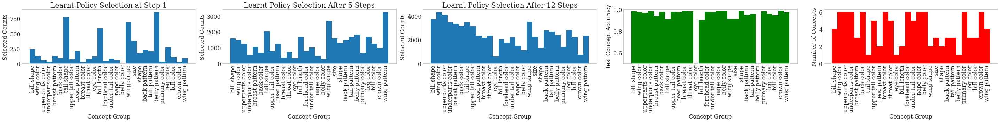

In [113]:
group_names = list(concept_map.keys())
group_distributions = np.array(
    list(map(lambda x: to_group_counts(x, concept_map, group_names), greedy_val_distribution))
)
group_distributions = np.array([
    group_distributions[i] - group_distributions[i-1] for i in range(1, len(group_distributions))
]).astype(np.int)
num_samples = np.sum(group_distributions[0])

steps = [1, list(range(6)), [1,2,3,4,5,6,7,8,9,10,11,12]]
fig, axs = plt.subplots(
    1,
    len(steps) + 2,
    figsize=((len(steps) + 2)*8, 5),
    squeeze=False,
)
for idx, step in enumerate(steps):
    if isinstance(step, int):
        distr = group_distributions[step - 1]
    else:
        distr = np.zeros(group_distributions[0].shape)
        for inner_step in step:
            distr += group_distributions[inner_step - 1]

    ax = axs[0, idx]
    x_vals = list(range(1, distr.shape[0] + 1))
    ax.bar(
        x=x_vals,
        height=distr,
        width=1,
    )
    ax.xaxis.set_tick_params(labelsize=16)
    ax.yaxis.set_tick_params(labelsize=16)
    ax.set_xlabel(f"Concept Group", fontsize=16)
    ax.set_ylabel(f"Selected Counts", fontsize=16)
    if isinstance(step, int):
        ax.set_title(f"Learnt Policy Selection at Step {step}", fontsize=20)
    else:
        ax.set_title(f"Learnt Policy Selection After {step[-1]} Steps", fontsize=20)
    # ax.set_ylabel(f"{dataset_name}\nTask Accuracy (%)", fontsize=16)
    ax.grid(False)
    ax.set_xticks(x_vals, list(map(lambda x: x.replace("has_", "").replace("_", " "), group_names)), rotation=90)

ax = axs[0, -2]
x_vals = list(range(1, distr.shape[0] + 1))
ax.bar(
    x=x_vals,
    height=group_concept_acc,
    width=1,
    color='green',
)
ax.xaxis.set_tick_params(labelsize=16)
ax.yaxis.set_tick_params(labelsize=16)
ax.set_xlabel(f"Concept Group", fontsize=16)
ax.set_ylim(0.5, 1)
ax.set_ylabel(f"Test Concept Accuracy", fontsize=16)
# ax.set_title(f"", fontsize=20)
# ax.set_ylabel(f"{dataset_name}\nTask Accuracy (%)", fontsize=16)
ax.grid(False)
ax.set_xticks(x_vals, list(map(lambda x: x.replace("has_", "").replace("_", " "), group_names)), rotation=90)



ax = axs[0, -1]
x_vals = list(range(1, distr.shape[0] + 1))
ax.bar(
    x=x_vals,
    height=[len(concepts) for concepts in concept_map.values()],
    width=1,
    color='red',
)
ax.xaxis.set_tick_params(labelsize=16)
ax.yaxis.set_tick_params(labelsize=16)
ax.set_xlabel(f"Concept Group", fontsize=16)
ax.set_ylabel(f"Number of Concepts", fontsize=16)
ax.grid(False)
ax.set_xticks(x_vals, list(map(lambda x: x.replace("has_", "").replace("_", " "), group_names)), rotation=90)


plt.tight_layout()
plt.show()

/tmp/ipykernel_308528/1757268095.py:7: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  ]).astype(np.int)


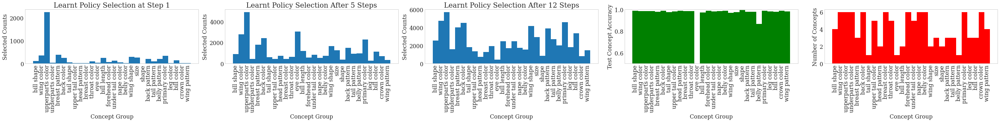

In [62]:
group_names = list(concept_map.keys())
group_distributions = np.array(
    list(map(lambda x: to_group_counts(x, concept_map, group_names), val_distribution))
)
group_distributions = np.array([
    group_distributions[i] - group_distributions[i-1] for i in range(1, len(group_distributions))
]).astype(np.int)
num_samples = np.sum(group_distributions[0])

steps = [1, list(range(6)), [1,2,3,4,5,6,7,8,9,10,11,12]]
fig, axs = plt.subplots(
    1,
    len(steps) + 2,
    figsize=((len(steps) + 2)*8, 5),
    squeeze=False,
)
for idx, step in enumerate(steps):
    if isinstance(step, int):
        distr = group_distributions[step - 1]
    else:
        distr = np.zeros(group_distributions[0].shape)
        for inner_step in step:
            distr += group_distributions[inner_step - 1]

    ax = axs[0, idx]
    x_vals = list(range(1, distr.shape[0] + 1))
    ax.bar(
        x=x_vals,
        height=distr,
        width=1,
    )
    ax.xaxis.set_tick_params(labelsize=16)
    ax.yaxis.set_tick_params(labelsize=16)
    ax.set_xlabel(f"Concept Group", fontsize=16)
    ax.set_ylabel(f"Selected Counts", fontsize=16)
    if isinstance(step, int):
        ax.set_title(f"Learnt Policy Selection at Step {step}", fontsize=20)
    else:
        ax.set_title(f"Learnt Policy Selection After {step[-1]} Steps", fontsize=20)
    # ax.set_ylabel(f"{dataset_name}\nTask Accuracy (%)", fontsize=16)
    ax.grid(False)
    ax.set_xticks(x_vals, list(map(lambda x: x.replace("has_", "").replace("_", " "), group_names)), rotation=90)

ax = axs[0, -2]
x_vals = list(range(1, distr.shape[0] + 1))
ax.bar(
    x=x_vals,
    height=group_concept_acc,
    width=1,
    color='green',
)
ax.xaxis.set_tick_params(labelsize=16)
ax.yaxis.set_tick_params(labelsize=16)
ax.set_xlabel(f"Concept Group", fontsize=16)
ax.set_ylim(0.5, 1)
ax.set_ylabel(f"Test Concept Accuracy", fontsize=16)
# ax.set_title(f"", fontsize=20)
# ax.set_ylabel(f"{dataset_name}\nTask Accuracy (%)", fontsize=16)
ax.grid(False)
ax.set_xticks(x_vals, list(map(lambda x: x.replace("has_", "").replace("_", " "), group_names)), rotation=90)



ax = axs[0, -1]
x_vals = list(range(1, distr.shape[0] + 1))
ax.bar(
    x=x_vals,
    height=[len(concepts) for concepts in concept_map.values()],
    width=1,
    color='red',
)
ax.xaxis.set_tick_params(labelsize=16)
ax.yaxis.set_tick_params(labelsize=16)
ax.set_xlabel(f"Concept Group", fontsize=16)
ax.set_ylabel(f"Number of Concepts", fontsize=16)
ax.grid(False)
ax.set_xticks(x_vals, list(map(lambda x: x.replace("has_", "").replace("_", " "), group_names)), rotation=90)


plt.tight_layout()
plt.show()

/tmp/ipykernel_3581853/4291101738.py:7: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  ]).astype(np.int)


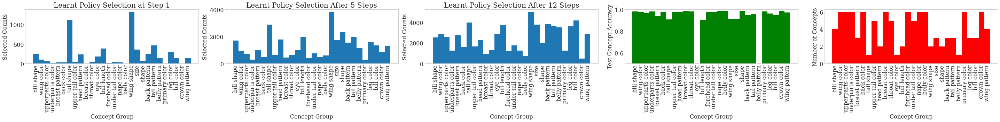

In [115]:
group_names = list(concept_map.keys())
group_distributions = np.array(
    list(map(lambda x: to_group_counts(x, concept_map, group_names), coop_val_distribution))
)
group_distributions = np.array([
    group_distributions[i] - group_distributions[i-1] for i in range(1, len(group_distributions))
]).astype(np.int)
num_samples = np.sum(group_distributions[0])

steps = [1, list(range(6)), [1,2,3,4,5,6,7,8,9,10,11,12]]
fig, axs = plt.subplots(
    1,
    len(steps) + 2,
    figsize=((len(steps) + 2)*8, 5),
    squeeze=False,
)
for idx, step in enumerate(steps):
    if isinstance(step, int):
        distr = group_distributions[step - 1]
    else:
        distr = np.zeros(group_distributions[0].shape)
        for inner_step in step:
            distr += group_distributions[inner_step - 1]

    ax = axs[0, idx]
    x_vals = list(range(1, distr.shape[0] + 1))
    ax.bar(
        x=x_vals,
        height=distr,
        width=1,
    )
    ax.xaxis.set_tick_params(labelsize=16)
    ax.yaxis.set_tick_params(labelsize=16)
    ax.set_xlabel(f"Concept Group", fontsize=16)
    ax.set_ylabel(f"Selected Counts", fontsize=16)
    if isinstance(step, int):
        ax.set_title(f"Learnt Policy Selection at Step {step}", fontsize=20)
    else:
        ax.set_title(f"Learnt Policy Selection After {step[-1]} Steps", fontsize=20)
    # ax.set_ylabel(f"{dataset_name}\nTask Accuracy (%)", fontsize=16)
    ax.grid(False)
    ax.set_xticks(x_vals, list(map(lambda x: x.replace("has_", "").replace("_", " "), group_names)), rotation=90)

ax = axs[0, -2]
x_vals = list(range(1, distr.shape[0] + 1))
ax.bar(
    x=x_vals,
    height=group_concept_acc,
    width=1,
    color='green',
)
ax.xaxis.set_tick_params(labelsize=16)
ax.yaxis.set_tick_params(labelsize=16)
ax.set_xlabel(f"Concept Group", fontsize=16)
ax.set_ylim(0.5, 1)
ax.set_ylabel(f"Test Concept Accuracy", fontsize=16)
# ax.set_title(f"", fontsize=20)
# ax.set_ylabel(f"{dataset_name}\nTask Accuracy (%)", fontsize=16)
ax.grid(False)
ax.set_xticks(x_vals, list(map(lambda x: x.replace("has_", "").replace("_", " "), group_names)), rotation=90)



ax = axs[0, -1]
x_vals = list(range(1, distr.shape[0] + 1))
ax.bar(
    x=x_vals,
    height=[len(concepts) for concepts in concept_map.values()],
    width=1,
    color='red',
)
ax.xaxis.set_tick_params(labelsize=16)
ax.yaxis.set_tick_params(labelsize=16)
ax.set_xlabel(f"Concept Group", fontsize=16)
ax.set_ylabel(f"Number of Concepts", fontsize=16)
ax.grid(False)
ax.set_xticks(x_vals, list(map(lambda x: x.replace("has_", "").replace("_", " "), group_names)), rotation=90)


plt.tight_layout()
plt.show()

# Policy Frequency Analysis

/home/me466/venv/lib/python3.8/site-packages/pytorch_lightning-1.9.5-py3.8.egg/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=1)` instead.
  rank_zero_deprecation(
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 0 we have [0.7720055229547808]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 1 we have [0.7720055229547808, 0.8037625129444252]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 2 we have [0.7720055229547808, 0.8037625129444252, 0.8396617190196756]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 3 we have [0.7720055229547808, 0.8037625129444252, 0.8396617190196756, 0.865723161891612]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 4 we have [0.7720055229547808, 0.8037625129444252, 0.8396617190196756, 0.865723161891612, 0.8940283051432516]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 5 we have [0.7720055229547808, 0.8037625129444252, 0.8396617190196756, 0.865723161891612, 0.8940283051432516, 0.9145667932343804]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 6 we have [0.7720055229547808, 0.8037625129444252, 0.8396617190196756, 0.865723161891612, 0.8940283051432516, 0.9145667932343804, 0.9304452882292026]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 7 we have [0.7720055229547808, 0.8037625129444252, 0.8396617190196756, 0.865723161891612, 0.8940283051432516, 0.9145667932343804, 0.9304452882292026, 0.9451156368657232]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 8 we have [0.7720055229547808, 0.8037625129444252, 0.8396617190196756, 0.865723161891612, 0.8940283051432516, 0.9145667932343804, 0.9304452882292026, 0.9451156368657232, 0.9571971004487401]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 9 we have [0.7720055229547808, 0.8037625129444252, 0.8396617190196756, 0.865723161891612, 0.8940283051432516, 0.9145667932343804, 0.9304452882292026, 0.9451156368657232, 0.9571971004487401, 0.9654815326199516]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 10 we have [0.7720055229547808, 0.8037625129444252, 0.8396617190196756, 0.865723161891612, 0.8940283051432516, 0.9145667932343804, 0.9304452882292026, 0.9451156368657232, 0.9571971004487401, 0.9654815326199516, 0.9751467034863652]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 11 we have [0.7720055229547808, 0.8037625129444252, 0.8396617190196756, 0.865723161891612, 0.8940283051432516, 0.9145667932343804, 0.9304452882292026, 0.9451156368657232, 0.9571971004487401, 0.9654815326199516, 0.9751467034863652, 0.9827407663099759]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 12 we have [0.7720055229547808, 0.8037625129444252, 0.8396617190196756, 0.865723161891612, 0.8940283051432516, 0.9145667932343804, 0.9304452882292026, 0.9451156368657232, 0.9571971004487401, 0.9654815326199516, 0.9751467034863652, 0.9827407663099759, 0.9874007594062824]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 13 we have [0.7720055229547808, 0.8037625129444252, 0.8396617190196756, 0.865723161891612, 0.8940283051432516, 0.9145667932343804, 0.9304452882292026, 0.9451156368657232, 0.9571971004487401, 0.9654815326199516, 0.9751467034863652, 0.9827407663099759, 0.9874007594062824, 0.9901622367966862]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 14 we have [0.7720055229547808, 0.8037625129444252, 0.8396617190196756, 0.865723161891612, 0.8940283051432516, 0.9145667932343804, 0.9304452882292026, 0.9451156368657232, 0.9571971004487401, 0.9654815326199516, 0.9751467034863652, 0.9827407663099759, 0.9874007594062824, 0.9901622367966862, 0.9922333448394891]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 15 we have [0.7720055229547808, 0.8037625129444252, 0.8396617190196756, 0.865723161891612, 0.8940283051432516, 0.9145667932343804, 0.9304452882292026, 0.9451156368657232, 0.9571971004487401, 0.9654815326199516, 0.9751467034863652, 0.9827407663099759, 0.9874007594062824, 0.9901622367966862, 0.9922333448394891, 0.9941318605453918]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 16 we have [0.7720055229547808, 0.8037625129444252, 0.8396617190196756, 0.865723161891612, 0.8940283051432516, 0.9145667932343804, 0.9304452882292026, 0.9451156368657232, 0.9571971004487401, 0.9654815326199516, 0.9751467034863652, 0.9827407663099759, 0.9874007594062824, 0.9901622367966862, 0.9922333448394891, 0.9941318605453918, 0.9958577839143942]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 17 we have [0.7720055229547808, 0.8037625129444252, 0.8396617190196756, 0.865723161891612, 0.8940283051432516, 0.9145667932343804, 0.9304452882292026, 0.9451156368657232, 0.9571971004487401, 0.9654815326199516, 0.9751467034863652, 0.9827407663099759, 0.9874007594062824, 0.9901622367966862, 0.9922333448394891, 0.9941318605453918, 0.9958577839143942, 0.9965481532619952]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 18 we have [0.7720055229547808, 0.8037625129444252, 0.8396617190196756, 0.865723161891612, 0.8940283051432516, 0.9145667932343804, 0.9304452882292026, 0.9451156368657232, 0.9571971004487401, 0.9654815326199516, 0.9751467034863652, 0.9827407663099759, 0.9874007594062824, 0.9901622367966862, 0.9922333448394891, 0.9941318605453918, 0.9958577839143942, 0.9965481532619952, 0.9963755609250949]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 19 we have [0.7720055229547808, 0.8037625129444252, 0.8396617190196756, 0.865723161891612, 0.8940283051432516, 0.9145667932343804, 0.9304452882292026, 0.9451156368657232, 0.9571971004487401, 0.9654815326199516, 0.9751467034863652, 0.9827407663099759, 0.9874007594062824, 0.9901622367966862, 0.9922333448394891, 0.9941318605453918, 0.9958577839143942, 0.9965481532619952, 0.9963755609250949, 0.9968933379357956]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 20 we have [0.7720055229547808, 0.8037625129444252, 0.8396617190196756, 0.865723161891612, 0.8940283051432516, 0.9145667932343804, 0.9304452882292026, 0.9451156368657232, 0.9571971004487401, 0.9654815326199516, 0.9751467034863652, 0.9827407663099759, 0.9874007594062824, 0.9901622367966862, 0.9922333448394891, 0.9941318605453918, 0.9958577839143942, 0.9965481532619952, 0.9963755609250949, 0.9968933379357956, 0.9972385226095961]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 21 we have [0.7720055229547808, 0.8037625129444252, 0.8396617190196756, 0.865723161891612, 0.8940283051432516, 0.9145667932343804, 0.9304452882292026, 0.9451156368657232, 0.9571971004487401, 0.9654815326199516, 0.9751467034863652, 0.9827407663099759, 0.9874007594062824, 0.9901622367966862, 0.9922333448394891, 0.9941318605453918, 0.9958577839143942, 0.9965481532619952, 0.9963755609250949, 0.9968933379357956, 0.9972385226095961, 0.9974111149464964]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 22 we have [0.7720055229547808, 0.8037625129444252, 0.8396617190196756, 0.865723161891612, 0.8940283051432516, 0.9145667932343804, 0.9304452882292026, 0.9451156368657232, 0.9571971004487401, 0.9654815326199516, 0.9751467034863652, 0.9827407663099759, 0.9874007594062824, 0.9901622367966862, 0.9922333448394891, 0.9941318605453918, 0.9958577839143942, 0.9965481532619952, 0.9963755609250949, 0.9968933379357956, 0.9972385226095961, 0.9974111149464964, 0.9975837072833966]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 23 we have [0.7720055229547808, 0.8037625129444252, 0.8396617190196756, 0.865723161891612, 0.8940283051432516, 0.9145667932343804, 0.9304452882292026, 0.9451156368657232, 0.9571971004487401, 0.9654815326199516, 0.9751467034863652, 0.9827407663099759, 0.9874007594062824, 0.9901622367966862, 0.9922333448394891, 0.9941318605453918, 0.9958577839143942, 0.9965481532619952, 0.9963755609250949, 0.9968933379357956, 0.9972385226095961, 0.9974111149464964, 0.9975837072833966, 0.9975837072833966]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 24 we have [0.7720055229547808, 0.8037625129444252, 0.8396617190196756, 0.865723161891612, 0.8940283051432516, 0.9145667932343804, 0.9304452882292026, 0.9451156368657232, 0.9571971004487401, 0.9654815326199516, 0.9751467034863652, 0.9827407663099759, 0.9874007594062824, 0.9901622367966862, 0.9922333448394891, 0.9941318605453918, 0.9958577839143942, 0.9965481532619952, 0.9963755609250949, 0.9968933379357956, 0.9972385226095961, 0.9974111149464964, 0.9975837072833966, 0.9975837072833966, 0.9975837072833966]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 25 we have [0.7720055229547808, 0.8037625129444252, 0.8396617190196756, 0.865723161891612, 0.8940283051432516, 0.9145667932343804, 0.9304452882292026, 0.9451156368657232, 0.9571971004487401, 0.9654815326199516, 0.9751467034863652, 0.9827407663099759, 0.9874007594062824, 0.9901622367966862, 0.9922333448394891, 0.9941318605453918, 0.9958577839143942, 0.9965481532619952, 0.9963755609250949, 0.9968933379357956, 0.9972385226095961, 0.9974111149464964, 0.9975837072833966, 0.9975837072833966, 0.9975837072833966, 0.9975837072833966]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 26 we have [0.7720055229547808, 0.8037625129444252, 0.8396617190196756, 0.865723161891612, 0.8940283051432516, 0.9145667932343804, 0.9304452882292026, 0.9451156368657232, 0.9571971004487401, 0.9654815326199516, 0.9751467034863652, 0.9827407663099759, 0.9874007594062824, 0.9901622367966862, 0.9922333448394891, 0.9941318605453918, 0.9958577839143942, 0.9965481532619952, 0.9963755609250949, 0.9968933379357956, 0.9972385226095961, 0.9974111149464964, 0.9975837072833966, 0.9975837072833966, 0.9975837072833966, 0.9975837072833966, 0.9977562996202969]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 27 we have [0.7720055229547808, 0.8037625129444252, 0.8396617190196756, 0.865723161891612, 0.8940283051432516, 0.9145667932343804, 0.9304452882292026, 0.9451156368657232, 0.9571971004487401, 0.9654815326199516, 0.9751467034863652, 0.9827407663099759, 0.9874007594062824, 0.9901622367966862, 0.9922333448394891, 0.9941318605453918, 0.9958577839143942, 0.9965481532619952, 0.9963755609250949, 0.9968933379357956, 0.9972385226095961, 0.9974111149464964, 0.9975837072833966, 0.9975837072833966, 0.9975837072833966, 0.9975837072833966, 0.9977562996202969, 0.9977562996202969]


Predicting: 0it [00:00, ?it/s]

With 28 we have [0.7720055229547808, 0.8037625129444252, 0.8396617190196756, 0.865723161891612, 0.8940283051432516, 0.9145667932343804, 0.9304452882292026, 0.9451156368657232, 0.9571971004487401, 0.9654815326199516, 0.9751467034863652, 0.9827407663099759, 0.9874007594062824, 0.9901622367966862, 0.9922333448394891, 0.9941318605453918, 0.9958577839143942, 0.9965481532619952, 0.9963755609250949, 0.9968933379357956, 0.9972385226095961, 0.9974111149464964, 0.9975837072833966, 0.9975837072833966, 0.9975837072833966, 0.9975837072833966, 0.9977562996202969, 0.9977562996202969, 0.9977562996202969]


/tmp/ipykernel_3110203/1561328664.py:196: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  ]).astype(np.int)


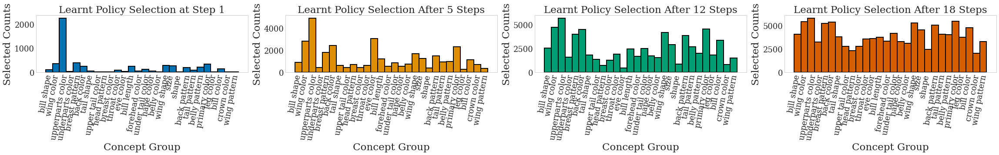

/home/me466/venv/lib/python3.8/site-packages/pytorch_lightning-1.9.5-py3.8.egg/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=1)` instead.
  rank_zero_deprecation(
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 0 we have [0.779254401104591]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 1 we have [0.779254401104591, 0.7937521574042112]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 2 we have [0.779254401104591, 0.7937521574042112, 0.8194684156023473]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 3 we have [0.779254401104591, 0.7937521574042112, 0.8194684156023473, 0.845012081463583]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 4 we have [0.779254401104591, 0.7937521574042112, 0.8194684156023473, 0.845012081463583, 0.8684846392820159]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 5 we have [0.779254401104591, 0.7937521574042112, 0.8194684156023473, 0.845012081463583, 0.8684846392820159, 0.8938557128063513]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 6 we have [0.779254401104591, 0.7937521574042112, 0.8194684156023473, 0.845012081463583, 0.8684846392820159, 0.8938557128063513, 0.9149119779081809]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 7 we have [0.779254401104591, 0.7937521574042112, 0.8194684156023473, 0.845012081463583, 0.8684846392820159, 0.8938557128063513, 0.9149119779081809, 0.9314808422506041]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 8 we have [0.779254401104591, 0.7937521574042112, 0.8194684156023473, 0.845012081463583, 0.8684846392820159, 0.8938557128063513, 0.9149119779081809, 0.9314808422506041, 0.9473593372454263]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 9 we have [0.779254401104591, 0.7937521574042112, 0.8194684156023473, 0.845012081463583, 0.8684846392820159, 0.8938557128063513, 0.9149119779081809, 0.9314808422506041, 0.9473593372454263, 0.9578874697963411]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 10 we have [0.779254401104591, 0.7937521574042112, 0.8194684156023473, 0.845012081463583, 0.8684846392820159, 0.8938557128063513, 0.9149119779081809, 0.9314808422506041, 0.9473593372454263, 0.9578874697963411, 0.9668622713151536]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 11 we have [0.779254401104591, 0.7937521574042112, 0.8194684156023473, 0.845012081463583, 0.8684846392820159, 0.8938557128063513, 0.9149119779081809, 0.9314808422506041, 0.9473593372454263, 0.9578874697963411, 0.9668622713151536, 0.9748015188125647]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 12 we have [0.779254401104591, 0.7937521574042112, 0.8194684156023473, 0.845012081463583, 0.8684846392820159, 0.8938557128063513, 0.9149119779081809, 0.9314808422506041, 0.9473593372454263, 0.9578874697963411, 0.9668622713151536, 0.9748015188125647, 0.9825681739730756]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 13 we have [0.779254401104591, 0.7937521574042112, 0.8194684156023473, 0.845012081463583, 0.8684846392820159, 0.8938557128063513, 0.9149119779081809, 0.9314808422506041, 0.9473593372454263, 0.9578874697963411, 0.9668622713151536, 0.9748015188125647, 0.9825681739730756, 0.9889540904383846]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 14 we have [0.779254401104591, 0.7937521574042112, 0.8194684156023473, 0.845012081463583, 0.8684846392820159, 0.8938557128063513, 0.9149119779081809, 0.9314808422506041, 0.9473593372454263, 0.9578874697963411, 0.9668622713151536, 0.9748015188125647, 0.9825681739730756, 0.9889540904383846, 0.9918881601656886]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 15 we have [0.779254401104591, 0.7937521574042112, 0.8194684156023473, 0.845012081463583, 0.8684846392820159, 0.8938557128063513, 0.9149119779081809, 0.9314808422506041, 0.9473593372454263, 0.9578874697963411, 0.9668622713151536, 0.9748015188125647, 0.9825681739730756, 0.9889540904383846, 0.9918881601656886, 0.993614083534691]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 16 we have [0.779254401104591, 0.7937521574042112, 0.8194684156023473, 0.845012081463583, 0.8684846392820159, 0.8938557128063513, 0.9149119779081809, 0.9314808422506041, 0.9473593372454263, 0.9578874697963411, 0.9668622713151536, 0.9748015188125647, 0.9825681739730756, 0.9889540904383846, 0.9918881601656886, 0.993614083534691, 0.9953400069036935]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 17 we have [0.779254401104591, 0.7937521574042112, 0.8194684156023473, 0.845012081463583, 0.8684846392820159, 0.8938557128063513, 0.9149119779081809, 0.9314808422506041, 0.9473593372454263, 0.9578874697963411, 0.9668622713151536, 0.9748015188125647, 0.9825681739730756, 0.9889540904383846, 0.9918881601656886, 0.993614083534691, 0.9953400069036935, 0.9968933379357956]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 18 we have [0.779254401104591, 0.7937521574042112, 0.8194684156023473, 0.845012081463583, 0.8684846392820159, 0.8938557128063513, 0.9149119779081809, 0.9314808422506041, 0.9473593372454263, 0.9578874697963411, 0.9668622713151536, 0.9748015188125647, 0.9825681739730756, 0.9889540904383846, 0.9918881601656886, 0.993614083534691, 0.9953400069036935, 0.9968933379357956, 0.9974111149464964]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 19 we have [0.779254401104591, 0.7937521574042112, 0.8194684156023473, 0.845012081463583, 0.8684846392820159, 0.8938557128063513, 0.9149119779081809, 0.9314808422506041, 0.9473593372454263, 0.9578874697963411, 0.9668622713151536, 0.9748015188125647, 0.9825681739730756, 0.9889540904383846, 0.9918881601656886, 0.993614083534691, 0.9953400069036935, 0.9968933379357956, 0.9974111149464964, 0.9979288919571971]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 20 we have [0.779254401104591, 0.7937521574042112, 0.8194684156023473, 0.845012081463583, 0.8684846392820159, 0.8938557128063513, 0.9149119779081809, 0.9314808422506041, 0.9473593372454263, 0.9578874697963411, 0.9668622713151536, 0.9748015188125647, 0.9825681739730756, 0.9889540904383846, 0.9918881601656886, 0.993614083534691, 0.9953400069036935, 0.9968933379357956, 0.9974111149464964, 0.9979288919571971, 0.9982740766309975]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 21 we have [0.779254401104591, 0.7937521574042112, 0.8194684156023473, 0.845012081463583, 0.8684846392820159, 0.8938557128063513, 0.9149119779081809, 0.9314808422506041, 0.9473593372454263, 0.9578874697963411, 0.9668622713151536, 0.9748015188125647, 0.9825681739730756, 0.9889540904383846, 0.9918881601656886, 0.993614083534691, 0.9953400069036935, 0.9968933379357956, 0.9974111149464964, 0.9979288919571971, 0.9982740766309975, 0.9986192613047981]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 22 we have [0.779254401104591, 0.7937521574042112, 0.8194684156023473, 0.845012081463583, 0.8684846392820159, 0.8938557128063513, 0.9149119779081809, 0.9314808422506041, 0.9473593372454263, 0.9578874697963411, 0.9668622713151536, 0.9748015188125647, 0.9825681739730756, 0.9889540904383846, 0.9918881601656886, 0.993614083534691, 0.9953400069036935, 0.9968933379357956, 0.9974111149464964, 0.9979288919571971, 0.9982740766309975, 0.9986192613047981, 0.9986192613047981]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 23 we have [0.779254401104591, 0.7937521574042112, 0.8194684156023473, 0.845012081463583, 0.8684846392820159, 0.8938557128063513, 0.9149119779081809, 0.9314808422506041, 0.9473593372454263, 0.9578874697963411, 0.9668622713151536, 0.9748015188125647, 0.9825681739730756, 0.9889540904383846, 0.9918881601656886, 0.993614083534691, 0.9953400069036935, 0.9968933379357956, 0.9974111149464964, 0.9979288919571971, 0.9982740766309975, 0.9986192613047981, 0.9986192613047981, 0.9986192613047981]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 24 we have [0.779254401104591, 0.7937521574042112, 0.8194684156023473, 0.845012081463583, 0.8684846392820159, 0.8938557128063513, 0.9149119779081809, 0.9314808422506041, 0.9473593372454263, 0.9578874697963411, 0.9668622713151536, 0.9748015188125647, 0.9825681739730756, 0.9889540904383846, 0.9918881601656886, 0.993614083534691, 0.9953400069036935, 0.9968933379357956, 0.9974111149464964, 0.9979288919571971, 0.9982740766309975, 0.9986192613047981, 0.9986192613047981, 0.9986192613047981, 0.9986192613047981]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 25 we have [0.779254401104591, 0.7937521574042112, 0.8194684156023473, 0.845012081463583, 0.8684846392820159, 0.8938557128063513, 0.9149119779081809, 0.9314808422506041, 0.9473593372454263, 0.9578874697963411, 0.9668622713151536, 0.9748015188125647, 0.9825681739730756, 0.9889540904383846, 0.9918881601656886, 0.993614083534691, 0.9953400069036935, 0.9968933379357956, 0.9974111149464964, 0.9979288919571971, 0.9982740766309975, 0.9986192613047981, 0.9986192613047981, 0.9986192613047981, 0.9986192613047981, 0.9986192613047981]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 26 we have [0.779254401104591, 0.7937521574042112, 0.8194684156023473, 0.845012081463583, 0.8684846392820159, 0.8938557128063513, 0.9149119779081809, 0.9314808422506041, 0.9473593372454263, 0.9578874697963411, 0.9668622713151536, 0.9748015188125647, 0.9825681739730756, 0.9889540904383846, 0.9918881601656886, 0.993614083534691, 0.9953400069036935, 0.9968933379357956, 0.9974111149464964, 0.9979288919571971, 0.9982740766309975, 0.9986192613047981, 0.9986192613047981, 0.9986192613047981, 0.9986192613047981, 0.9986192613047981, 0.9986192613047981]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 27 we have [0.779254401104591, 0.7937521574042112, 0.8194684156023473, 0.845012081463583, 0.8684846392820159, 0.8938557128063513, 0.9149119779081809, 0.9314808422506041, 0.9473593372454263, 0.9578874697963411, 0.9668622713151536, 0.9748015188125647, 0.9825681739730756, 0.9889540904383846, 0.9918881601656886, 0.993614083534691, 0.9953400069036935, 0.9968933379357956, 0.9974111149464964, 0.9979288919571971, 0.9982740766309975, 0.9986192613047981, 0.9986192613047981, 0.9986192613047981, 0.9986192613047981, 0.9986192613047981, 0.9986192613047981, 0.9986192613047981]


Predicting: 0it [00:00, ?it/s]

With 28 we have [0.779254401104591, 0.7937521574042112, 0.8194684156023473, 0.845012081463583, 0.8684846392820159, 0.8938557128063513, 0.9149119779081809, 0.9314808422506041, 0.9473593372454263, 0.9578874697963411, 0.9668622713151536, 0.9748015188125647, 0.9825681739730756, 0.9889540904383846, 0.9918881601656886, 0.993614083534691, 0.9953400069036935, 0.9968933379357956, 0.9974111149464964, 0.9979288919571971, 0.9982740766309975, 0.9986192613047981, 0.9986192613047981, 0.9986192613047981, 0.9986192613047981, 0.9986192613047981, 0.9986192613047981, 0.9986192613047981, 0.9986192613047981]


/tmp/ipykernel_3110203/1561328664.py:196: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  ]).astype(np.int)


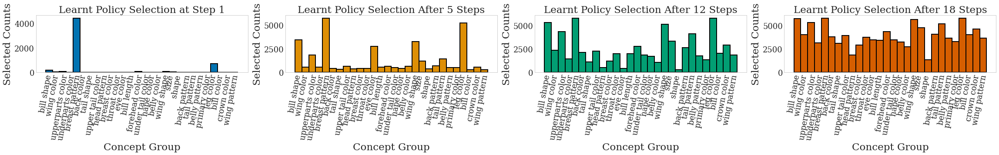

/home/me466/venv/lib/python3.8/site-packages/pytorch_lightning-1.9.5-py3.8.egg/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=1)` instead.
  rank_zero_deprecation(
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 0 we have [0.7882292026234036]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 1 we have [0.7882292026234036, 0.8173973075595443]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 2 we have [0.7882292026234036, 0.8173973075595443, 0.8448394891266828]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 3 we have [0.7882292026234036, 0.8173973075595443, 0.8448394891266828, 0.8688298239558163]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 4 we have [0.7882292026234036, 0.8173973075595443, 0.8448394891266828, 0.8688298239558163, 0.8959268208491543]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 5 we have [0.7882292026234036, 0.8173973075595443, 0.8448394891266828, 0.8688298239558163, 0.8959268208491543, 0.9143942008974801]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 6 we have [0.7882292026234036, 0.8173973075595443, 0.8448394891266828, 0.8688298239558163, 0.8959268208491543, 0.9143942008974801, 0.9326889886089058]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 7 we have [0.7882292026234036, 0.8173973075595443, 0.8448394891266828, 0.8688298239558163, 0.8959268208491543, 0.9143942008974801, 0.9326889886089058, 0.9480497065930272]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 8 we have [0.7882292026234036, 0.8173973075595443, 0.8448394891266828, 0.8688298239558163, 0.8959268208491543, 0.9143942008974801, 0.9326889886089058, 0.9480497065930272, 0.9618570935450466]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 9 we have [0.7882292026234036, 0.8173973075595443, 0.8448394891266828, 0.8688298239558163, 0.8959268208491543, 0.9143942008974801, 0.9326889886089058, 0.9480497065930272, 0.9618570935450466, 0.9715222644114602]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 10 we have [0.7882292026234036, 0.8173973075595443, 0.8448394891266828, 0.8688298239558163, 0.8959268208491543, 0.9143942008974801, 0.9326889886089058, 0.9480497065930272, 0.9618570935450466, 0.9715222644114602, 0.9787711425612703]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 11 we have [0.7882292026234036, 0.8173973075595443, 0.8448394891266828, 0.8688298239558163, 0.8959268208491543, 0.9143942008974801, 0.9326889886089058, 0.9480497065930272, 0.9618570935450466, 0.9715222644114602, 0.9787711425612703, 0.9839489126682776]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 12 we have [0.7882292026234036, 0.8173973075595443, 0.8448394891266828, 0.8688298239558163, 0.8959268208491543, 0.9143942008974801, 0.9326889886089058, 0.9480497065930272, 0.9618570935450466, 0.9715222644114602, 0.9787711425612703, 0.9839489126682776, 0.9889540904383846]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 13 we have [0.7882292026234036, 0.8173973075595443, 0.8448394891266828, 0.8688298239558163, 0.8959268208491543, 0.9143942008974801, 0.9326889886089058, 0.9480497065930272, 0.9618570935450466, 0.9715222644114602, 0.9787711425612703, 0.9839489126682776, 0.9889540904383846, 0.9915429754918882]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 14 we have [0.7882292026234036, 0.8173973075595443, 0.8448394891266828, 0.8688298239558163, 0.8959268208491543, 0.9143942008974801, 0.9326889886089058, 0.9480497065930272, 0.9618570935450466, 0.9715222644114602, 0.9787711425612703, 0.9839489126682776, 0.9889540904383846, 0.9915429754918882, 0.9932688988608905]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 15 we have [0.7882292026234036, 0.8173973075595443, 0.8448394891266828, 0.8688298239558163, 0.8959268208491543, 0.9143942008974801, 0.9326889886089058, 0.9480497065930272, 0.9618570935450466, 0.9715222644114602, 0.9787711425612703, 0.9839489126682776, 0.9889540904383846, 0.9915429754918882, 0.9932688988608905, 0.9958577839143942]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 16 we have [0.7882292026234036, 0.8173973075595443, 0.8448394891266828, 0.8688298239558163, 0.8959268208491543, 0.9143942008974801, 0.9326889886089058, 0.9480497065930272, 0.9618570935450466, 0.9715222644114602, 0.9787711425612703, 0.9839489126682776, 0.9889540904383846, 0.9915429754918882, 0.9932688988608905, 0.9958577839143942, 0.9965481532619952]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 17 we have [0.7882292026234036, 0.8173973075595443, 0.8448394891266828, 0.8688298239558163, 0.8959268208491543, 0.9143942008974801, 0.9326889886089058, 0.9480497065930272, 0.9618570935450466, 0.9715222644114602, 0.9787711425612703, 0.9839489126682776, 0.9889540904383846, 0.9915429754918882, 0.9932688988608905, 0.9958577839143942, 0.9965481532619952, 0.9970659302726959]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 18 we have [0.7882292026234036, 0.8173973075595443, 0.8448394891266828, 0.8688298239558163, 0.8959268208491543, 0.9143942008974801, 0.9326889886089058, 0.9480497065930272, 0.9618570935450466, 0.9715222644114602, 0.9787711425612703, 0.9839489126682776, 0.9889540904383846, 0.9915429754918882, 0.9932688988608905, 0.9958577839143942, 0.9965481532619952, 0.9970659302726959, 0.9972385226095961]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 19 we have [0.7882292026234036, 0.8173973075595443, 0.8448394891266828, 0.8688298239558163, 0.8959268208491543, 0.9143942008974801, 0.9326889886089058, 0.9480497065930272, 0.9618570935450466, 0.9715222644114602, 0.9787711425612703, 0.9839489126682776, 0.9889540904383846, 0.9915429754918882, 0.9932688988608905, 0.9958577839143942, 0.9965481532619952, 0.9970659302726959, 0.9972385226095961, 0.9979288919571971]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 20 we have [0.7882292026234036, 0.8173973075595443, 0.8448394891266828, 0.8688298239558163, 0.8959268208491543, 0.9143942008974801, 0.9326889886089058, 0.9480497065930272, 0.9618570935450466, 0.9715222644114602, 0.9787711425612703, 0.9839489126682776, 0.9889540904383846, 0.9915429754918882, 0.9932688988608905, 0.9958577839143942, 0.9965481532619952, 0.9970659302726959, 0.9972385226095961, 0.9979288919571971, 0.9986192613047981]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 21 we have [0.7882292026234036, 0.8173973075595443, 0.8448394891266828, 0.8688298239558163, 0.8959268208491543, 0.9143942008974801, 0.9326889886089058, 0.9480497065930272, 0.9618570935450466, 0.9715222644114602, 0.9787711425612703, 0.9839489126682776, 0.9889540904383846, 0.9915429754918882, 0.9932688988608905, 0.9958577839143942, 0.9965481532619952, 0.9970659302726959, 0.9972385226095961, 0.9979288919571971, 0.9986192613047981, 0.9986192613047981]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 22 we have [0.7882292026234036, 0.8173973075595443, 0.8448394891266828, 0.8688298239558163, 0.8959268208491543, 0.9143942008974801, 0.9326889886089058, 0.9480497065930272, 0.9618570935450466, 0.9715222644114602, 0.9787711425612703, 0.9839489126682776, 0.9889540904383846, 0.9915429754918882, 0.9932688988608905, 0.9958577839143942, 0.9965481532619952, 0.9970659302726959, 0.9972385226095961, 0.9979288919571971, 0.9986192613047981, 0.9986192613047981, 0.9986192613047981]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 23 we have [0.7882292026234036, 0.8173973075595443, 0.8448394891266828, 0.8688298239558163, 0.8959268208491543, 0.9143942008974801, 0.9326889886089058, 0.9480497065930272, 0.9618570935450466, 0.9715222644114602, 0.9787711425612703, 0.9839489126682776, 0.9889540904383846, 0.9915429754918882, 0.9932688988608905, 0.9958577839143942, 0.9965481532619952, 0.9970659302726959, 0.9972385226095961, 0.9979288919571971, 0.9986192613047981, 0.9986192613047981, 0.9986192613047981, 0.9987918536416983]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 24 we have [0.7882292026234036, 0.8173973075595443, 0.8448394891266828, 0.8688298239558163, 0.8959268208491543, 0.9143942008974801, 0.9326889886089058, 0.9480497065930272, 0.9618570935450466, 0.9715222644114602, 0.9787711425612703, 0.9839489126682776, 0.9889540904383846, 0.9915429754918882, 0.9932688988608905, 0.9958577839143942, 0.9965481532619952, 0.9970659302726959, 0.9972385226095961, 0.9979288919571971, 0.9986192613047981, 0.9986192613047981, 0.9986192613047981, 0.9987918536416983, 0.9987918536416983]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 25 we have [0.7882292026234036, 0.8173973075595443, 0.8448394891266828, 0.8688298239558163, 0.8959268208491543, 0.9143942008974801, 0.9326889886089058, 0.9480497065930272, 0.9618570935450466, 0.9715222644114602, 0.9787711425612703, 0.9839489126682776, 0.9889540904383846, 0.9915429754918882, 0.9932688988608905, 0.9958577839143942, 0.9965481532619952, 0.9970659302726959, 0.9972385226095961, 0.9979288919571971, 0.9986192613047981, 0.9986192613047981, 0.9986192613047981, 0.9987918536416983, 0.9987918536416983, 0.9987918536416983]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 26 we have [0.7882292026234036, 0.8173973075595443, 0.8448394891266828, 0.8688298239558163, 0.8959268208491543, 0.9143942008974801, 0.9326889886089058, 0.9480497065930272, 0.9618570935450466, 0.9715222644114602, 0.9787711425612703, 0.9839489126682776, 0.9889540904383846, 0.9915429754918882, 0.9932688988608905, 0.9958577839143942, 0.9965481532619952, 0.9970659302726959, 0.9972385226095961, 0.9979288919571971, 0.9986192613047981, 0.9986192613047981, 0.9986192613047981, 0.9987918536416983, 0.9987918536416983, 0.9987918536416983, 0.9987918536416983]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 27 we have [0.7882292026234036, 0.8173973075595443, 0.8448394891266828, 0.8688298239558163, 0.8959268208491543, 0.9143942008974801, 0.9326889886089058, 0.9480497065930272, 0.9618570935450466, 0.9715222644114602, 0.9787711425612703, 0.9839489126682776, 0.9889540904383846, 0.9915429754918882, 0.9932688988608905, 0.9958577839143942, 0.9965481532619952, 0.9970659302726959, 0.9972385226095961, 0.9979288919571971, 0.9986192613047981, 0.9986192613047981, 0.9986192613047981, 0.9987918536416983, 0.9987918536416983, 0.9987918536416983, 0.9987918536416983, 0.9987918536416983]


Predicting: 0it [00:00, ?it/s]

With 28 we have [0.7882292026234036, 0.8173973075595443, 0.8448394891266828, 0.8688298239558163, 0.8959268208491543, 0.9143942008974801, 0.9326889886089058, 0.9480497065930272, 0.9618570935450466, 0.9715222644114602, 0.9787711425612703, 0.9839489126682776, 0.9889540904383846, 0.9915429754918882, 0.9932688988608905, 0.9958577839143942, 0.9965481532619952, 0.9970659302726959, 0.9972385226095961, 0.9979288919571971, 0.9986192613047981, 0.9986192613047981, 0.9986192613047981, 0.9987918536416983, 0.9987918536416983, 0.9987918536416983, 0.9987918536416983, 0.9987918536416983, 0.9987918536416983]


/tmp/ipykernel_3110203/1561328664.py:196: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  ]).astype(np.int)


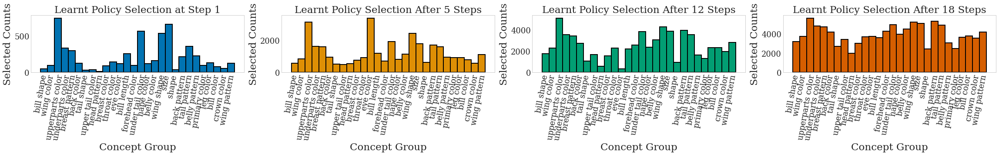

/home/me466/venv/lib/python3.8/site-packages/pytorch_lightning-1.9.5-py3.8.egg/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=1)` instead.
  rank_zero_deprecation(
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 0 we have [0.7816706938211944]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 1 we have [0.7816706938211944, 0.8120469451156369]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 2 we have [0.7816706938211944, 0.8120469451156369, 0.8420780117362789]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 3 we have [0.7816706938211944, 0.8120469451156369, 0.8420780117362789, 0.8693476009665171]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 4 we have [0.7816706938211944, 0.8120469451156369, 0.8420780117362789, 0.8693476009665171, 0.8904038660683465]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 5 we have [0.7816706938211944, 0.8120469451156369, 0.8420780117362789, 0.8693476009665171, 0.8904038660683465, 0.9116327235070762]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 6 we have [0.7816706938211944, 0.8120469451156369, 0.8420780117362789, 0.8693476009665171, 0.8904038660683465, 0.9116327235070762, 0.9294097342078012]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 7 we have [0.7816706938211944, 0.8120469451156369, 0.8420780117362789, 0.8693476009665171, 0.8904038660683465, 0.9116327235070762, 0.9294097342078012, 0.9433897134967207]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 8 we have [0.7816706938211944, 0.8120469451156369, 0.8420780117362789, 0.8693476009665171, 0.8904038660683465, 0.9116327235070762, 0.9294097342078012, 0.9433897134967207, 0.9547808077321367]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 9 we have [0.7816706938211944, 0.8120469451156369, 0.8420780117362789, 0.8693476009665171, 0.8904038660683465, 0.9116327235070762, 0.9294097342078012, 0.9433897134967207, 0.9547808077321367, 0.9663444943044529]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 10 we have [0.7816706938211944, 0.8120469451156369, 0.8420780117362789, 0.8693476009665171, 0.8904038660683465, 0.9116327235070762, 0.9294097342078012, 0.9433897134967207, 0.9547808077321367, 0.9663444943044529, 0.974974111149465]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 11 we have [0.7816706938211944, 0.8120469451156369, 0.8420780117362789, 0.8693476009665171, 0.8904038660683465, 0.9116327235070762, 0.9294097342078012, 0.9433897134967207, 0.9547808077321367, 0.9663444943044529, 0.974974111149465, 0.9801518812564722]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 12 we have [0.7816706938211944, 0.8120469451156369, 0.8420780117362789, 0.8693476009665171, 0.8904038660683465, 0.9116327235070762, 0.9294097342078012, 0.9433897134967207, 0.9547808077321367, 0.9663444943044529, 0.974974111149465, 0.9801518812564722, 0.9870555747324818]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 13 we have [0.7816706938211944, 0.8120469451156369, 0.8420780117362789, 0.8693476009665171, 0.8904038660683465, 0.9116327235070762, 0.9294097342078012, 0.9433897134967207, 0.9547808077321367, 0.9663444943044529, 0.974974111149465, 0.9801518812564722, 0.9870555747324818, 0.9908526061442872]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 14 we have [0.7816706938211944, 0.8120469451156369, 0.8420780117362789, 0.8693476009665171, 0.8904038660683465, 0.9116327235070762, 0.9294097342078012, 0.9433897134967207, 0.9547808077321367, 0.9663444943044529, 0.974974111149465, 0.9801518812564722, 0.9870555747324818, 0.9908526061442872, 0.9927511218501899]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 15 we have [0.7816706938211944, 0.8120469451156369, 0.8420780117362789, 0.8693476009665171, 0.8904038660683465, 0.9116327235070762, 0.9294097342078012, 0.9433897134967207, 0.9547808077321367, 0.9663444943044529, 0.974974111149465, 0.9801518812564722, 0.9870555747324818, 0.9908526061442872, 0.9927511218501899, 0.994994822229893]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 16 we have [0.7816706938211944, 0.8120469451156369, 0.8420780117362789, 0.8693476009665171, 0.8904038660683465, 0.9116327235070762, 0.9294097342078012, 0.9433897134967207, 0.9547808077321367, 0.9663444943044529, 0.974974111149465, 0.9801518812564722, 0.9870555747324818, 0.9908526061442872, 0.9927511218501899, 0.994994822229893, 0.9960303762512944]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 17 we have [0.7816706938211944, 0.8120469451156369, 0.8420780117362789, 0.8693476009665171, 0.8904038660683465, 0.9116327235070762, 0.9294097342078012, 0.9433897134967207, 0.9547808077321367, 0.9663444943044529, 0.974974111149465, 0.9801518812564722, 0.9870555747324818, 0.9908526061442872, 0.9927511218501899, 0.994994822229893, 0.9960303762512944, 0.9967207455988955]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 18 we have [0.7816706938211944, 0.8120469451156369, 0.8420780117362789, 0.8693476009665171, 0.8904038660683465, 0.9116327235070762, 0.9294097342078012, 0.9433897134967207, 0.9547808077321367, 0.9663444943044529, 0.974974111149465, 0.9801518812564722, 0.9870555747324818, 0.9908526061442872, 0.9927511218501899, 0.994994822229893, 0.9960303762512944, 0.9967207455988955, 0.9972385226095961]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 19 we have [0.7816706938211944, 0.8120469451156369, 0.8420780117362789, 0.8693476009665171, 0.8904038660683465, 0.9116327235070762, 0.9294097342078012, 0.9433897134967207, 0.9547808077321367, 0.9663444943044529, 0.974974111149465, 0.9801518812564722, 0.9870555747324818, 0.9908526061442872, 0.9927511218501899, 0.994994822229893, 0.9960303762512944, 0.9967207455988955, 0.9972385226095961, 0.9981014842940974]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 20 we have [0.7816706938211944, 0.8120469451156369, 0.8420780117362789, 0.8693476009665171, 0.8904038660683465, 0.9116327235070762, 0.9294097342078012, 0.9433897134967207, 0.9547808077321367, 0.9663444943044529, 0.974974111149465, 0.9801518812564722, 0.9870555747324818, 0.9908526061442872, 0.9927511218501899, 0.994994822229893, 0.9960303762512944, 0.9967207455988955, 0.9972385226095961, 0.9981014842940974, 0.9984466689678978]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 21 we have [0.7816706938211944, 0.8120469451156369, 0.8420780117362789, 0.8693476009665171, 0.8904038660683465, 0.9116327235070762, 0.9294097342078012, 0.9433897134967207, 0.9547808077321367, 0.9663444943044529, 0.974974111149465, 0.9801518812564722, 0.9870555747324818, 0.9908526061442872, 0.9927511218501899, 0.994994822229893, 0.9960303762512944, 0.9967207455988955, 0.9972385226095961, 0.9981014842940974, 0.9984466689678978, 0.9986192613047981]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 22 we have [0.7816706938211944, 0.8120469451156369, 0.8420780117362789, 0.8693476009665171, 0.8904038660683465, 0.9116327235070762, 0.9294097342078012, 0.9433897134967207, 0.9547808077321367, 0.9663444943044529, 0.974974111149465, 0.9801518812564722, 0.9870555747324818, 0.9908526061442872, 0.9927511218501899, 0.994994822229893, 0.9960303762512944, 0.9967207455988955, 0.9972385226095961, 0.9981014842940974, 0.9984466689678978, 0.9986192613047981, 0.9989644459785986]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 23 we have [0.7816706938211944, 0.8120469451156369, 0.8420780117362789, 0.8693476009665171, 0.8904038660683465, 0.9116327235070762, 0.9294097342078012, 0.9433897134967207, 0.9547808077321367, 0.9663444943044529, 0.974974111149465, 0.9801518812564722, 0.9870555747324818, 0.9908526061442872, 0.9927511218501899, 0.994994822229893, 0.9960303762512944, 0.9967207455988955, 0.9972385226095961, 0.9981014842940974, 0.9984466689678978, 0.9986192613047981, 0.9989644459785986, 0.9991370383154988]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 24 we have [0.7816706938211944, 0.8120469451156369, 0.8420780117362789, 0.8693476009665171, 0.8904038660683465, 0.9116327235070762, 0.9294097342078012, 0.9433897134967207, 0.9547808077321367, 0.9663444943044529, 0.974974111149465, 0.9801518812564722, 0.9870555747324818, 0.9908526061442872, 0.9927511218501899, 0.994994822229893, 0.9960303762512944, 0.9967207455988955, 0.9972385226095961, 0.9981014842940974, 0.9984466689678978, 0.9986192613047981, 0.9989644459785986, 0.9991370383154988, 0.9993096306523991]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 25 we have [0.7816706938211944, 0.8120469451156369, 0.8420780117362789, 0.8693476009665171, 0.8904038660683465, 0.9116327235070762, 0.9294097342078012, 0.9433897134967207, 0.9547808077321367, 0.9663444943044529, 0.974974111149465, 0.9801518812564722, 0.9870555747324818, 0.9908526061442872, 0.9927511218501899, 0.994994822229893, 0.9960303762512944, 0.9967207455988955, 0.9972385226095961, 0.9981014842940974, 0.9984466689678978, 0.9986192613047981, 0.9989644459785986, 0.9991370383154988, 0.9993096306523991, 0.9993096306523991]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 26 we have [0.7816706938211944, 0.8120469451156369, 0.8420780117362789, 0.8693476009665171, 0.8904038660683465, 0.9116327235070762, 0.9294097342078012, 0.9433897134967207, 0.9547808077321367, 0.9663444943044529, 0.974974111149465, 0.9801518812564722, 0.9870555747324818, 0.9908526061442872, 0.9927511218501899, 0.994994822229893, 0.9960303762512944, 0.9967207455988955, 0.9972385226095961, 0.9981014842940974, 0.9984466689678978, 0.9986192613047981, 0.9989644459785986, 0.9991370383154988, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 27 we have [0.7816706938211944, 0.8120469451156369, 0.8420780117362789, 0.8693476009665171, 0.8904038660683465, 0.9116327235070762, 0.9294097342078012, 0.9433897134967207, 0.9547808077321367, 0.9663444943044529, 0.974974111149465, 0.9801518812564722, 0.9870555747324818, 0.9908526061442872, 0.9927511218501899, 0.994994822229893, 0.9960303762512944, 0.9967207455988955, 0.9972385226095961, 0.9981014842940974, 0.9984466689678978, 0.9986192613047981, 0.9989644459785986, 0.9991370383154988, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991]


Predicting: 0it [00:00, ?it/s]

With 28 we have [0.7816706938211944, 0.8120469451156369, 0.8420780117362789, 0.8693476009665171, 0.8904038660683465, 0.9116327235070762, 0.9294097342078012, 0.9433897134967207, 0.9547808077321367, 0.9663444943044529, 0.974974111149465, 0.9801518812564722, 0.9870555747324818, 0.9908526061442872, 0.9927511218501899, 0.994994822229893, 0.9960303762512944, 0.9967207455988955, 0.9972385226095961, 0.9981014842940974, 0.9984466689678978, 0.9986192613047981, 0.9989644459785986, 0.9991370383154988, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991, 0.9993096306523991]


/tmp/ipykernel_3110203/1561328664.py:196: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  ]).astype(np.int)


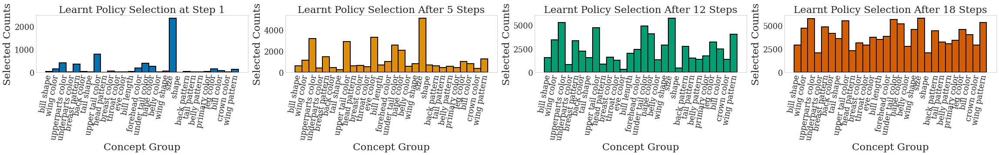

/home/me466/venv/lib/python3.8/site-packages/pytorch_lightning-1.9.5-py3.8.egg/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=1)` instead.
  rank_zero_deprecation(
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 0 we have [0.7813255091473938]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 1 we have [0.7813255091473938, 0.809285467725233]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 2 we have [0.7813255091473938, 0.809285467725233, 0.8382809803244736]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 3 we have [0.7813255091473938, 0.809285467725233, 0.8382809803244736, 0.8634794615119089]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 4 we have [0.7813255091473938, 0.809285467725233, 0.8382809803244736, 0.8634794615119089, 0.885053503624439]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 5 we have [0.7813255091473938, 0.809285467725233, 0.8382809803244736, 0.8634794615119089, 0.885053503624439, 0.903520883672765]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 6 we have [0.7813255091473938, 0.809285467725233, 0.8382809803244736, 0.8634794615119089, 0.885053503624439, 0.903520883672765, 0.9206075250258888]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 7 we have [0.7813255091473938, 0.809285467725233, 0.8382809803244736, 0.8634794615119089, 0.885053503624439, 0.903520883672765, 0.9206075250258888, 0.9370037970314118]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 8 we have [0.7813255091473938, 0.809285467725233, 0.8382809803244736, 0.8634794615119089, 0.885053503624439, 0.903520883672765, 0.9206075250258888, 0.9370037970314118, 0.9511563686572316]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 9 we have [0.7813255091473938, 0.809285467725233, 0.8382809803244736, 0.8634794615119089, 0.885053503624439, 0.903520883672765, 0.9206075250258888, 0.9370037970314118, 0.9511563686572316, 0.9625474628926476]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 10 we have [0.7813255091473938, 0.809285467725233, 0.8382809803244736, 0.8634794615119089, 0.885053503624439, 0.903520883672765, 0.9206075250258888, 0.9370037970314118, 0.9511563686572316, 0.9625474628926476, 0.9720400414221608]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 11 we have [0.7813255091473938, 0.809285467725233, 0.8382809803244736, 0.8634794615119089, 0.885053503624439, 0.903520883672765, 0.9206075250258888, 0.9370037970314118, 0.9511563686572316, 0.9625474628926476, 0.9720400414221608, 0.979979288919572]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 12 we have [0.7813255091473938, 0.809285467725233, 0.8382809803244736, 0.8634794615119089, 0.885053503624439, 0.903520883672765, 0.9206075250258888, 0.9370037970314118, 0.9511563686572316, 0.9625474628926476, 0.9720400414221608, 0.979979288919572, 0.9856748360372799]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 13 we have [0.7813255091473938, 0.809285467725233, 0.8382809803244736, 0.8634794615119089, 0.885053503624439, 0.903520883672765, 0.9206075250258888, 0.9370037970314118, 0.9511563686572316, 0.9625474628926476, 0.9720400414221608, 0.979979288919572, 0.9856748360372799, 0.9892992751121851]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 14 we have [0.7813255091473938, 0.809285467725233, 0.8382809803244736, 0.8634794615119089, 0.885053503624439, 0.903520883672765, 0.9206075250258888, 0.9370037970314118, 0.9511563686572316, 0.9625474628926476, 0.9720400414221608, 0.979979288919572, 0.9856748360372799, 0.9892992751121851, 0.9915429754918882]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 15 we have [0.7813255091473938, 0.809285467725233, 0.8382809803244736, 0.8634794615119089, 0.885053503624439, 0.903520883672765, 0.9206075250258888, 0.9370037970314118, 0.9511563686572316, 0.9625474628926476, 0.9720400414221608, 0.979979288919572, 0.9856748360372799, 0.9892992751121851, 0.9915429754918882, 0.9937866758715913]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 16 we have [0.7813255091473938, 0.809285467725233, 0.8382809803244736, 0.8634794615119089, 0.885053503624439, 0.903520883672765, 0.9206075250258888, 0.9370037970314118, 0.9511563686572316, 0.9625474628926476, 0.9720400414221608, 0.979979288919572, 0.9856748360372799, 0.9892992751121851, 0.9915429754918882, 0.9937866758715913, 0.9956851915774939]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 17 we have [0.7813255091473938, 0.809285467725233, 0.8382809803244736, 0.8634794615119089, 0.885053503624439, 0.903520883672765, 0.9206075250258888, 0.9370037970314118, 0.9511563686572316, 0.9625474628926476, 0.9720400414221608, 0.979979288919572, 0.9856748360372799, 0.9892992751121851, 0.9915429754918882, 0.9937866758715913, 0.9956851915774939, 0.9968933379357956]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 18 we have [0.7813255091473938, 0.809285467725233, 0.8382809803244736, 0.8634794615119089, 0.885053503624439, 0.903520883672765, 0.9206075250258888, 0.9370037970314118, 0.9511563686572316, 0.9625474628926476, 0.9720400414221608, 0.979979288919572, 0.9856748360372799, 0.9892992751121851, 0.9915429754918882, 0.9937866758715913, 0.9956851915774939, 0.9968933379357956, 0.9972385226095961]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 19 we have [0.7813255091473938, 0.809285467725233, 0.8382809803244736, 0.8634794615119089, 0.885053503624439, 0.903520883672765, 0.9206075250258888, 0.9370037970314118, 0.9511563686572316, 0.9625474628926476, 0.9720400414221608, 0.979979288919572, 0.9856748360372799, 0.9892992751121851, 0.9915429754918882, 0.9937866758715913, 0.9956851915774939, 0.9968933379357956, 0.9972385226095961, 0.9975837072833966]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 20 we have [0.7813255091473938, 0.809285467725233, 0.8382809803244736, 0.8634794615119089, 0.885053503624439, 0.903520883672765, 0.9206075250258888, 0.9370037970314118, 0.9511563686572316, 0.9625474628926476, 0.9720400414221608, 0.979979288919572, 0.9856748360372799, 0.9892992751121851, 0.9915429754918882, 0.9937866758715913, 0.9956851915774939, 0.9968933379357956, 0.9972385226095961, 0.9975837072833966, 0.9979288919571971]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 21 we have [0.7813255091473938, 0.809285467725233, 0.8382809803244736, 0.8634794615119089, 0.885053503624439, 0.903520883672765, 0.9206075250258888, 0.9370037970314118, 0.9511563686572316, 0.9625474628926476, 0.9720400414221608, 0.979979288919572, 0.9856748360372799, 0.9892992751121851, 0.9915429754918882, 0.9937866758715913, 0.9956851915774939, 0.9968933379357956, 0.9972385226095961, 0.9975837072833966, 0.9979288919571971, 0.9979288919571971]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 22 we have [0.7813255091473938, 0.809285467725233, 0.8382809803244736, 0.8634794615119089, 0.885053503624439, 0.903520883672765, 0.9206075250258888, 0.9370037970314118, 0.9511563686572316, 0.9625474628926476, 0.9720400414221608, 0.979979288919572, 0.9856748360372799, 0.9892992751121851, 0.9915429754918882, 0.9937866758715913, 0.9956851915774939, 0.9968933379357956, 0.9972385226095961, 0.9975837072833966, 0.9979288919571971, 0.9979288919571971, 0.9982740766309975]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 23 we have [0.7813255091473938, 0.809285467725233, 0.8382809803244736, 0.8634794615119089, 0.885053503624439, 0.903520883672765, 0.9206075250258888, 0.9370037970314118, 0.9511563686572316, 0.9625474628926476, 0.9720400414221608, 0.979979288919572, 0.9856748360372799, 0.9892992751121851, 0.9915429754918882, 0.9937866758715913, 0.9956851915774939, 0.9968933379357956, 0.9972385226095961, 0.9975837072833966, 0.9979288919571971, 0.9979288919571971, 0.9982740766309975, 0.9982740766309975]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 24 we have [0.7813255091473938, 0.809285467725233, 0.8382809803244736, 0.8634794615119089, 0.885053503624439, 0.903520883672765, 0.9206075250258888, 0.9370037970314118, 0.9511563686572316, 0.9625474628926476, 0.9720400414221608, 0.979979288919572, 0.9856748360372799, 0.9892992751121851, 0.9915429754918882, 0.9937866758715913, 0.9956851915774939, 0.9968933379357956, 0.9972385226095961, 0.9975837072833966, 0.9979288919571971, 0.9979288919571971, 0.9982740766309975, 0.9982740766309975, 0.9984466689678978]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 25 we have [0.7813255091473938, 0.809285467725233, 0.8382809803244736, 0.8634794615119089, 0.885053503624439, 0.903520883672765, 0.9206075250258888, 0.9370037970314118, 0.9511563686572316, 0.9625474628926476, 0.9720400414221608, 0.979979288919572, 0.9856748360372799, 0.9892992751121851, 0.9915429754918882, 0.9937866758715913, 0.9956851915774939, 0.9968933379357956, 0.9972385226095961, 0.9975837072833966, 0.9979288919571971, 0.9979288919571971, 0.9982740766309975, 0.9982740766309975, 0.9984466689678978, 0.9984466689678978]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 26 we have [0.7813255091473938, 0.809285467725233, 0.8382809803244736, 0.8634794615119089, 0.885053503624439, 0.903520883672765, 0.9206075250258888, 0.9370037970314118, 0.9511563686572316, 0.9625474628926476, 0.9720400414221608, 0.979979288919572, 0.9856748360372799, 0.9892992751121851, 0.9915429754918882, 0.9937866758715913, 0.9956851915774939, 0.9968933379357956, 0.9972385226095961, 0.9975837072833966, 0.9979288919571971, 0.9979288919571971, 0.9982740766309975, 0.9982740766309975, 0.9984466689678978, 0.9984466689678978, 0.9984466689678978]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


With 27 we have [0.7813255091473938, 0.809285467725233, 0.8382809803244736, 0.8634794615119089, 0.885053503624439, 0.903520883672765, 0.9206075250258888, 0.9370037970314118, 0.9511563686572316, 0.9625474628926476, 0.9720400414221608, 0.979979288919572, 0.9856748360372799, 0.9892992751121851, 0.9915429754918882, 0.9937866758715913, 0.9956851915774939, 0.9968933379357956, 0.9972385226095961, 0.9975837072833966, 0.9979288919571971, 0.9979288919571971, 0.9982740766309975, 0.9982740766309975, 0.9984466689678978, 0.9984466689678978, 0.9984466689678978, 0.9984466689678978]


Predicting: 0it [00:00, ?it/s]

With 28 we have [0.7813255091473938, 0.809285467725233, 0.8382809803244736, 0.8634794615119089, 0.885053503624439, 0.903520883672765, 0.9206075250258888, 0.9370037970314118, 0.9511563686572316, 0.9625474628926476, 0.9720400414221608, 0.979979288919572, 0.9856748360372799, 0.9892992751121851, 0.9915429754918882, 0.9937866758715913, 0.9956851915774939, 0.9968933379357956, 0.9972385226095961, 0.9975837072833966, 0.9979288919571971, 0.9979288919571971, 0.9982740766309975, 0.9982740766309975, 0.9984466689678978, 0.9984466689678978, 0.9984466689678978, 0.9984466689678978, 0.9984466689678978]


/tmp/ipykernel_3110203/1561328664.py:196: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  ]).astype(np.int)


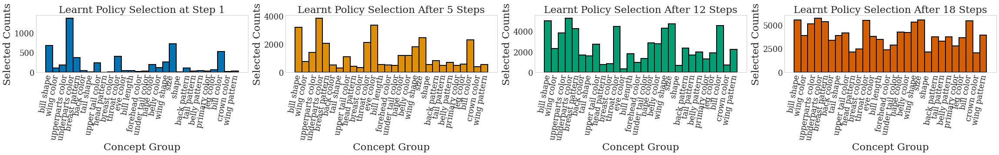

In [29]:
from cem.train.training import load_trained_model
from cem.interventions.random import IndependentRandomMaskIntPolicy
import pytorch_lightning as pl
import time
clrs = sns.color_palette("colorblind", 4)
all_val_distributions = []

for split in range(5):
    intcem_model_path = os.path.join(
        result_dir,
        f"IntAwareConceptEmbeddingModelRetry_intervention_weight_1_horizon_rate_1.005_intervention_discount_1_task_discount_1.1_resnet34_fold_{split + 1}.pt",
    )
    intcem_model_config = joblib.load(
        intcem_model_path.replace(".pt", "_experiment_config.joblib"),
    )

    cem_model_path = os.path.join(
        result_dir,
        f"ConceptEmbeddingModel_resnet34_fold_{split + 1}.pt"
    )
    cem_model_config = joblib.load(
        cem_model_path.replace(".pt", "_experiment_config.joblib"),
    )

    intcem = load_trained_model(
        config=intcem_model_config,
        n_tasks=n_tasks,
        result_dir=result_dir,
        n_concepts=n_concepts,
        split=split,
        imbalance=imbalance,
        task_class_weights=None,
        train_dl=train_dl,
        sequential=False,
        logger=False,
        independent=False,
        output_latent=True,
        output_interventions=True,
        enable_checkpointing=False,
    )

    cem = load_trained_model(
        config=intcem_model_config,
        n_tasks=n_tasks,
        result_dir=result_dir,
        n_concepts=n_concepts,
        split=split,
        imbalance=imbalance,
        task_class_weights=None,
        train_dl=train_dl,
        sequential=False,
        logger=False,
        independent=False,
        intervention_policy=None,
        output_latent=True,
        output_interventions=True,
        enable_checkpointing=False,
    )

    def competence_generator(
        x,
        y,
        c,
        concept_group_map,
    ):
        return np.ones(c.shape)

    prev_interventions_accum = []
    posterior_distrs = []
    c_preds = []
    val_distribution = np.zeros((len(concept_map) + 1, n_concepts))
    total_times = []
    prev_interventions = None
    intcem.intervention_policy = IndependentRandomMaskIntPolicy(
        cbm=intcem,
        concept_group_map=concept_map,
        num_groups_intervened=0,
        group_based=True,
        include_prior=True,
    )
    trainer = pl.Trainer(
        gpus=1,
        logger=False,
    )
    # Now include the competence that we will assume
    # for all concepts
    if hasattr(test_dl.dataset, 'tensors'):
        x_test, y_test, c_test = test_dl.dataset.tensors[:3]
    else:
        x_test, y_test, c_test = [], [], []
        for data in test_dl:
            if len(data) == 2:
                x, (y, c) = data
            else:
                (x, y, c) = data
            x_type = x.type()
            y_type = y.type()
            c_type = c.type()
            x_test.append(x)
            y_test.append(y)
            c_test.append(c)
        x_test = torch.FloatTensor(
            np.concatenate(x_test, axis=0)
        ).type(x_type)
        y_test = torch.FloatTensor(
            np.concatenate(y_test, axis=0)
        ).type(y_type)
        c_test = torch.FloatTensor(
            np.concatenate(c_test, axis=0)
        ).type(c_type)

    competencies_test = competence_generator(
        x=x_test,
        y=y_test,
        c=c_test,
        concept_group_map=concept_map,
    )
    c_test = concepts_from_competencies(c_test, competencies_test)
    competencies_test = torch.FloatTensor(competencies_test)
    np.random.seed(42)
    test_dl = torch.utils.data.DataLoader(
        dataset=torch.utils.data.TensorDataset(
            x_test,
            y_test,
            c_test,
            competencies_test,
        ),
        batch_size=test_dl.batch_size,
        num_workers=test_dl.num_workers,
    )
    prev_num_groups_intervened = 0
    avg_times = []
    intervention_accs = []
    for j, num_groups_intervened in enumerate(range(len(concept_map) + 1)):
        ####
        # Set the model's intervention policy
        ####
        intcem.intervention_policy.num_groups_intervened = (
            num_groups_intervened - prev_num_groups_intervened
        )
        start_time = time.time()
        test_batch_results = trainer.predict(
            intcem,
            test_dl,
        )
        c_pred = np.concatenate(
            list(map(lambda x: x[0].detach().cpu().numpy(), test_batch_results)),
            axis=0,
        )

        c_preds.append(c_pred)
        y_pred = np.concatenate(
            list(map(lambda x: x[2].detach().cpu().numpy(), test_batch_results)),
            axis=0,
        )
        total_times.append((time.time() - start_time)/(y_pred.shape[0]))
        posterior_distrs.append(y_pred)
        y_pred = np.argmax(y_pred, axis=-1)
        prev_interventions = np.concatenate(
            list(map(lambda x: x[3].detach().cpu().numpy(), test_batch_results)),
            axis=0,
        )
        prev_interventions_accum.append(prev_interventions)
        acc = np.mean(y_pred == y_test.detach().cpu().numpy())
        intervention_accs.append(acc)
        print("With", num_groups_intervened, "we have", intervention_accs)

        # And generate the next dataset so that we can reuse previous
        # interventions on the same samples in the future to save time
        if num_groups_intervened != 0:
            val_distribution[num_groups_intervened, :] = np.sum(
                prev_interventions,
                axis=0,
            )
        prev_num_groups_intervened = num_groups_intervened
        test_dl = torch.utils.data.DataLoader(
            dataset=torch.utils.data.TensorDataset(
                x_test,
                y_test,
                c_test,
                competencies_test,
                torch.IntTensor(prev_interventions),
            ),
            batch_size=test_dl.batch_size,
            num_workers=test_dl.num_workers,
        )
    all_val_distributions.append(val_distribution)
    ############################################################################
    # And now visualise into a histogram
    group_names = list(concept_map.keys())
    group_distributions = np.array(
        list(map(lambda x: to_group_counts(x, concept_map, group_names), val_distribution))
    )
    group_distributions = np.array([
        group_distributions[i] - group_distributions[i-1] for i in range(1, len(group_distributions))
    ]).astype(np.int)
    num_samples = np.sum(group_distributions[0])

    steps = [1, list(range(6)), [1,2,3,4,5,6,7,8,9,10,11,12], list(range(19))]
    fig, axs = plt.subplots(
        1,
        len(steps), # + 2,
        figsize=((len(steps))*8, 5),
        squeeze=False,
    )
    for idx, step in enumerate(steps):
        if isinstance(step, int):
            distr = group_distributions[step - 1]
        else:
            distr = np.zeros(group_distributions[0].shape)
            for inner_step in step:
                distr += group_distributions[inner_step - 1]

        ax = axs[0, idx]
        x_vals = list(range(1, distr.shape[0] + 1))
        ax.bar(
            x=x_vals,
            height=distr,
            width=1,
            color=clrs[idx],
            align='edge',
            linewidth=2,
            edgecolor='black',
        )
        ax.xaxis.set_tick_params(labelsize=18)
        ax.yaxis.set_tick_params(labelsize=18)
        ax.set_xlabel(f"Concept Group", fontsize=23)
        ax.set_ylabel(f"Selected Counts", fontsize=23)
        if isinstance(step, int):
            ax.set_title(f"Learnt Policy Selection at Step {step}", fontsize=23)
        else:
            ax.set_title(f"Learnt Policy Selection After {step[-1]} Steps", fontsize=23)
        # ax.set_ylabel(f"{dataset_name}\nTask Accuracy (%)", fontsize=16)
        ax.grid(False)
        ax.set_xticks(
            x_vals,
            list(map(lambda x: x.replace("has_", "").replace("_", " "), group_names)),
            rotation=80,
        )

    # ax = axs[0, -2]
    # x_vals = list(range(1, distr.shape[0] + 1))
    # ax.bar(
    #     x=x_vals,
    #     height=group_concept_acc,
    #     width=1,
    #     color='green',
    # )
    # ax.xaxis.set_tick_params(labelsize=16)
    # ax.yaxis.set_tick_params(labelsize=16)
    # ax.set_xlabel(f"Concept Group", fontsize=16)
    # ax.set_ylim(0.5, 1)
    # ax.set_ylabel(f"Test Concept Accuracy", fontsize=16)
    # # ax.set_title(f"", fontsize=20)
    # # ax.set_ylabel(f"{dataset_name}\nTask Accuracy (%)", fontsize=16)
    # ax.grid(False)
    # ax.set_xticks(x_vals, list(map(lambda x: x.replace("has_", "").replace("_", " "), group_names)), rotation=90)



    # ax = axs[0, -1]
    # x_vals = list(range(1, distr.shape[0] + 1))
    # ax.bar(
    #     x=x_vals,
    #     height=[len(concepts) for concepts in concept_map.values()],
    #     width=1,
    #     color='red',
    # )
    # ax.xaxis.set_tick_params(labelsize=16)
    # ax.yaxis.set_tick_params(labelsize=16)
    # ax.set_xlabel(f"Concept Group", fontsize=16)
    # ax.set_ylabel(f"Number of Concepts", fontsize=16)
    # ax.grid(False)
    # ax.set_xticks(x_vals, list(map(lambda x: x.replace("has_", "").replace("_", " "), group_names)), rotation=90)


    plt.tight_layout()
    plt.savefig(f"figures/policy_freq_split_{split}.pdf", bbox_inches='tight')
    plt.savefig(f"figures/policy_freq_split_{split}.png", bbox_inches='tight')
    plt.show()

/tmp/ipykernel_3110203/616421796.py:9: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  ]).astype(np.int)


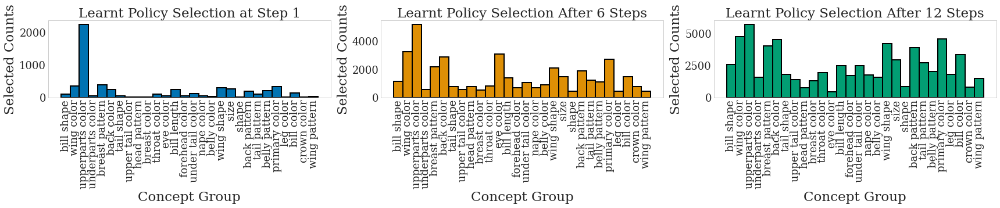

/tmp/ipykernel_3110203/616421796.py:9: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  ]).astype(np.int)


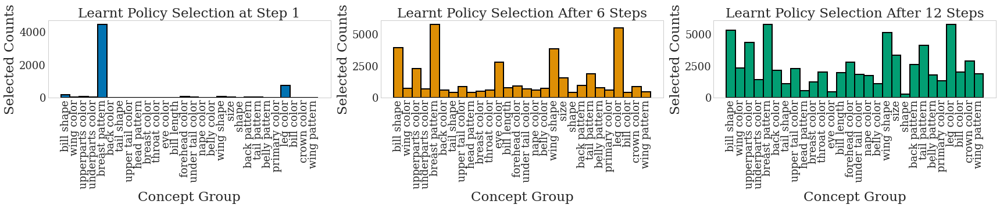

/tmp/ipykernel_3110203/616421796.py:9: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  ]).astype(np.int)


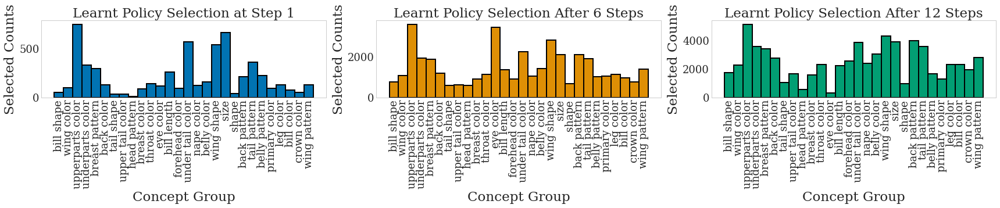

/tmp/ipykernel_3110203/616421796.py:9: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  ]).astype(np.int)


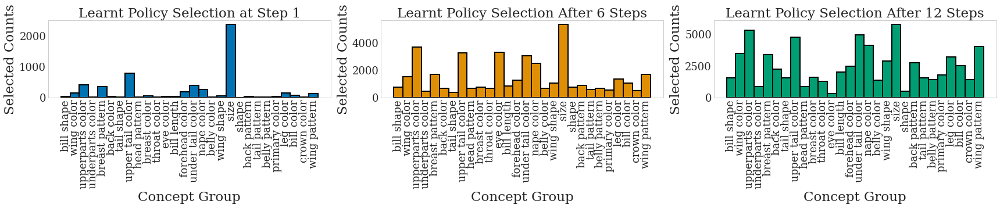

/tmp/ipykernel_3110203/616421796.py:9: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  ]).astype(np.int)


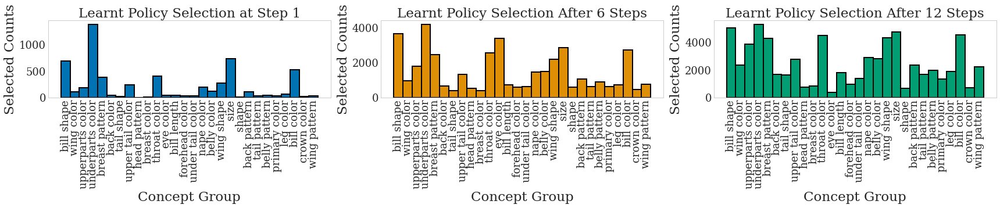

In [32]:
for split, val_distribution in enumerate(all_val_distributions):
    # And now visualise into a histogram
    group_names = list(concept_map.keys())
    group_distributions = np.array(
        list(map(lambda x: to_group_counts(x, concept_map, group_names), val_distribution))
    )
    group_distributions = np.array([
        group_distributions[i] - group_distributions[i-1] for i in range(1, len(group_distributions))
    ]).astype(np.int)
    num_samples = np.sum(group_distributions[0])

    steps = [1, list(range(7)), [1,2,3,4,5,6,7,8,9,10,11,12]]#, list(range(19))]
    fig, axs = plt.subplots(
        1,
        len(steps), # + 2,
        figsize=((len(steps))*8, 5),
        squeeze=False,
    )
    for idx, step in enumerate(steps):
        if isinstance(step, int):
            distr = group_distributions[step - 1]
        else:
            distr = np.zeros(group_distributions[0].shape)
            for inner_step in step:
                distr += group_distributions[inner_step - 1]

        ax = axs[0, idx]
        x_vals = list(range(1, distr.shape[0] + 1))
        ax.bar(
            x=x_vals,
            height=distr,
            width=1,
            color=clrs[idx],
            # align='edge',
            linewidth=2,
            edgecolor='black',
        )
        ax.xaxis.set_tick_params(labelsize=18)
        ax.yaxis.set_tick_params(labelsize=18)
        ax.set_xlabel(f"Concept Group", fontsize=23)
        ax.set_ylabel(f"Selected Counts", fontsize=23)
        if isinstance(step, int):
            ax.set_title(f"Learnt Policy Selection at Step {step}", fontsize=23)
        else:
            ax.set_title(f"Learnt Policy Selection After {step[-1]} Steps", fontsize=23)
        # ax.set_ylabel(f"{dataset_name}\nTask Accuracy (%)", fontsize=16)
        ax.grid(False)
        ax.set_xticks(
            x_vals,
            list(map(lambda x: x.replace("has_", "").replace("_", " "), group_names)),
            rotation=90,
        )

    plt.tight_layout()
    plt.savefig(f"figures/policy_freq_split_{split}.pdf", bbox_inches='tight')
    plt.savefig(f"figures/policy_freq_split_{split}.png", bbox_inches='tight')
    plt.show()